# Design an application for public health

### Context:
- The agency "Santé publique France" has launched a call for projects to find innovative ideas for applications related to food. You want to participate and propose an idea for an application.

#### Mission

1) Process the dataset, by:
    Thinking about an application idea.
    Identifying variables that are relevant to future processing and necessary for your application idea.
    Cleaning the data by :
    Highlighting any missing values, with at least 3 processing methods appropriate for the variables involved, identifying and quantifying the possible outliers of each variable.
    Automating these processes to avoid repeating these operations.
    
    
2) Throughout the analysis, produce visualizations to better understand the data. Perform a univariate analysis for each variable of interest to summarize its behavior.


3) Confirm or refute hypotheses using multivariate analysis. Perform appropriate statistical tests to verify the significance of the results.


4) Justify your application idea. Identify arguments to justify the feasibility (or not) of the application based on the Open Food Facts data.

## PART 2 - DATA EXPLORATION

## 1.0 Python libraries and datasets

### Importation of python libraries 

In [1]:
# importation of libraries

# data loading and manipulation
import pandas as pd
import numpy as np # for array creation

# data visualization
import matplotlib.pyplot as plt
import seaborn as sns

# statistical tests
import scipy.stats as st
import statsmodels.api as sm # One-way ANOVA
from statsmodels.formula.api import ols # One-way ANOVA

# apply standard scaler for data scaling
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler

# perform PCA 
from sklearn.decomposition import PCA

# Import functions created for this course
from functions import *

%matplotlib inline

In [2]:
# loading the dataset to pandas DataFrame

Data = pd.read_csv('Clean_Data_P3.csv', low_memory=False)
Data.head()

,code,product_name,pnns_groups_1,pnns_groups_2,nutrition_grade_fr,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition-score-fr_100g,nutrition-score-uk_100g
0,0000001938067,Chaussons tressés aux pommes,Sugary snacks,Biscuits and cakes,c,1090.0,10.70,9.124302,38.700000,24.700000,3.520498,3.330000,0.647000,0.255000,9.000000,9.000000
1,0000008237798,Quiche Lorraine,Composite foods,Pizza pies and quiche,b,478.0,6.79,2.860000,7.860000,0.714000,0.357000,5.360000,0.499000,0.196000,2.131309,2.136796
2,0000020424640,Belgische Pralinen,Sugary snacks,Sweets,e,2257.0,33.30,21.100000,60.565619,51.500000,3.520498,4.700000,0.090000,0.035433,11.977283,11.978147
3,0000027533048,Luxury Christmas Pudding,Sugary snacks,Biscuits and cakes,c,1284.0,7.00,3.600000,54.200000,45.109926,4.700000,5.877508,0.199898,0.078700,10.000000,10.000000
4,0000040608754,"Pepsi, Nouveau goût !",Beverages,Sweetened beverages,e,177.0,0.00,0.000000,10.400000,10.400000,0.000000,0.000000,0.025400,0.028669,13.000000,-1.095729


## 2.0 Exploratory analyses

### 2.1. Statistical Summary
 - Check the range of values of the variables

In [3]:
Data.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
energy_100g,40421.0,1142.177714,812.873006,0.0,410.000000,1016.000000,1790.000000,4000.000000
fat_100g,40421.0,14.529826,16.819655,0.0,3.968002,8.600000,19.034108,100.000000
saturated-fat_100g,40421.0,4.919651,6.582719,0.0,0.400000,3.065319,8.000000,100.000000
carbohydrates_100g,40421.0,30.708133,26.666932,0.0,7.800000,15.500000,57.316974,139.000000
sugars_100g,40421.0,14.502450,18.952494,0.0,2.600000,6.111708,13.736174,134.000000
fiber_100g,40421.0,2.480131,2.481954,0.0,0.321452,2.157020,3.520498,19.900000
proteins_100g,40421.0,6.771932,5.354204,0.0,2.231402,6.400000,9.463442,59.100000
salt_100g,40421.0,0.823504,1.135229,0.0,0.070000,0.584200,1.200000,29.470000
sodium_100g,40421.0,0.336247,1.059603,0.0,0.019685,0.207000,0.459000,117.165354
nutrition-score-fr_100g,40421.0,6.047936,6.452560,-15.0,0.000000,7.092639,11.977283,18.000000


### 2.2 Visual exploration and analysis 

#### 2.2.1. Univariate analysis

##### - Histograms and barplots
- visualize and understand the distribution of each variable

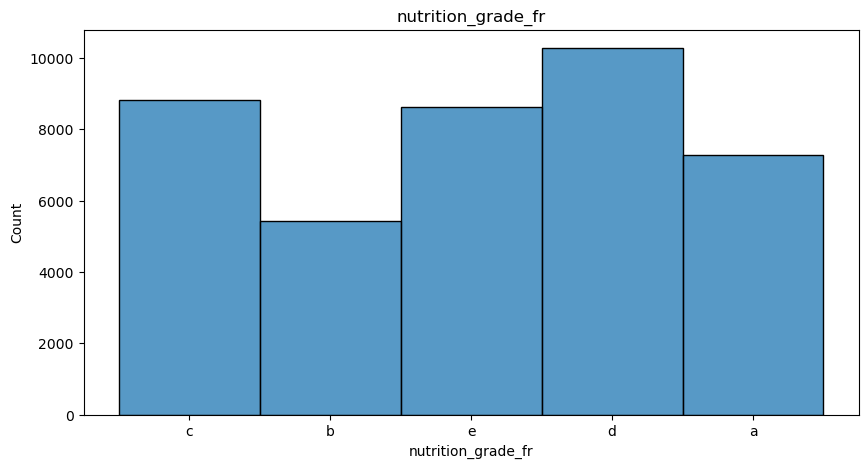

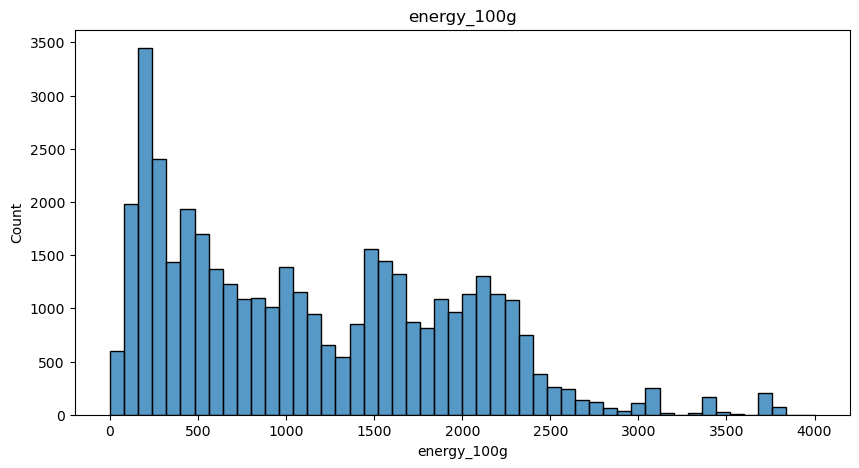

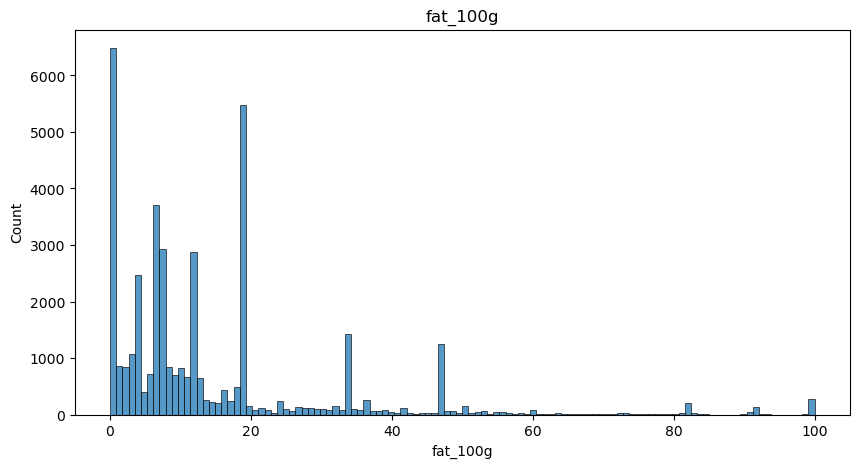

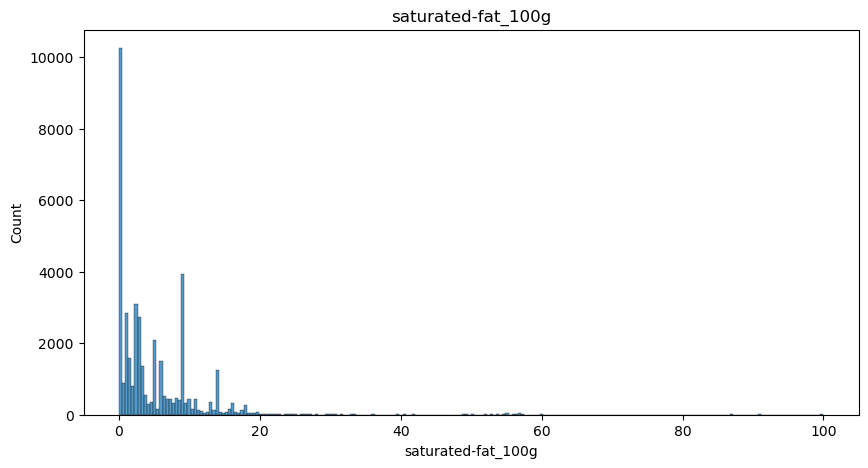

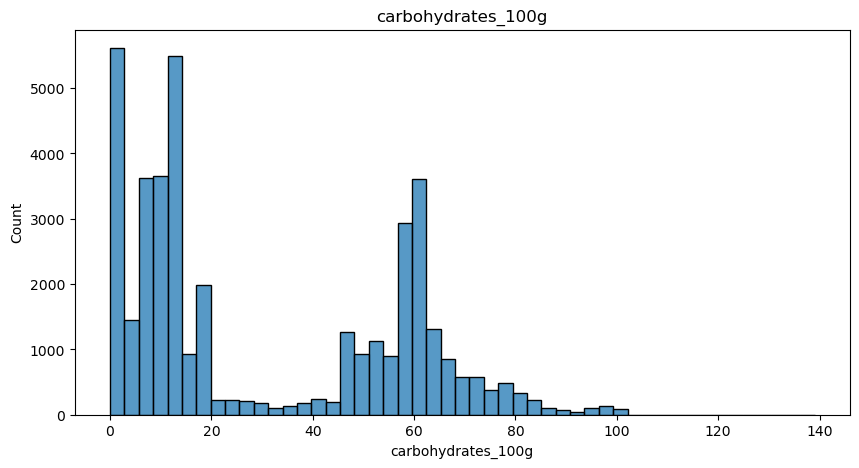

...

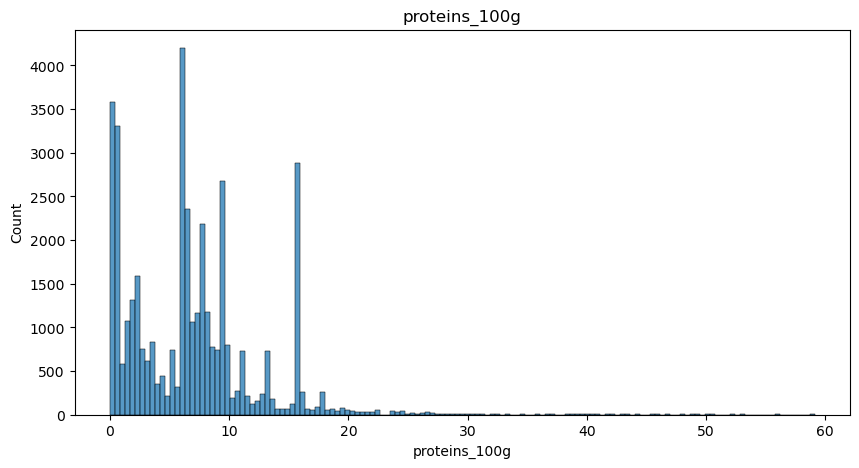

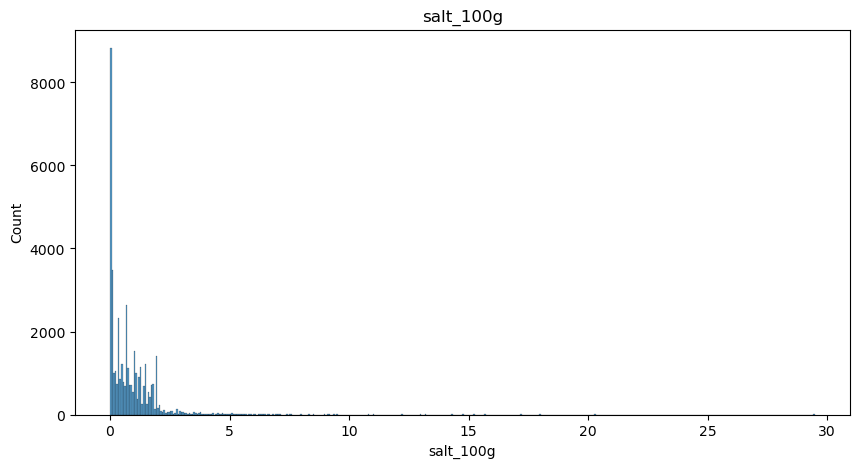

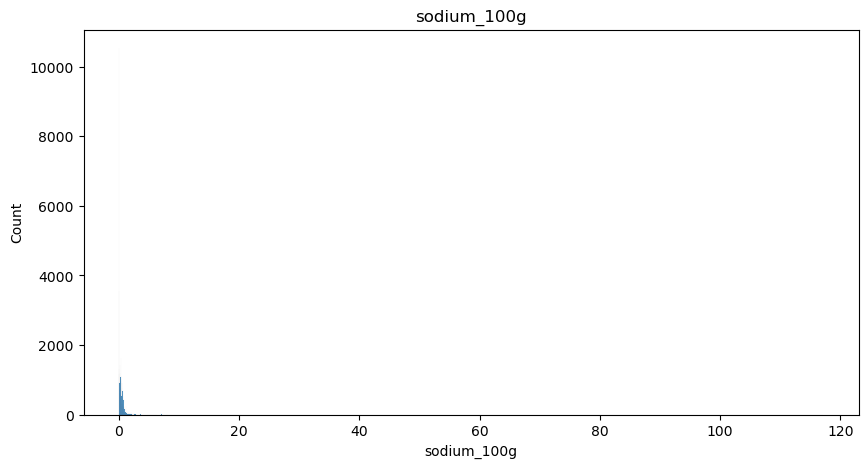

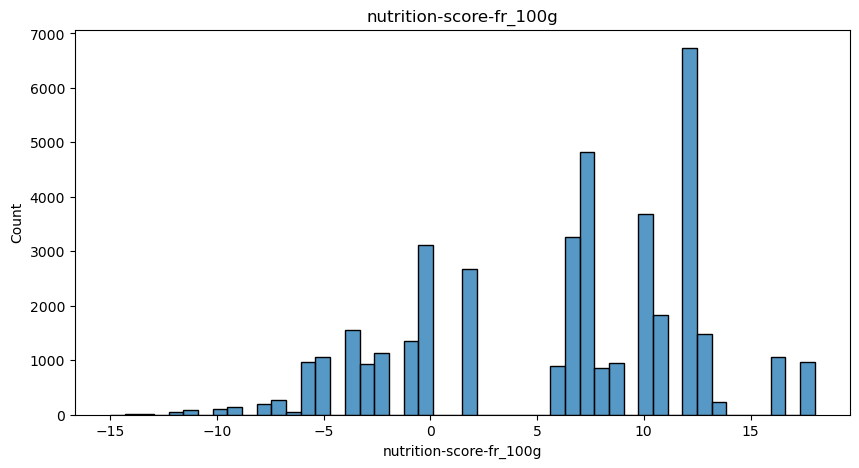

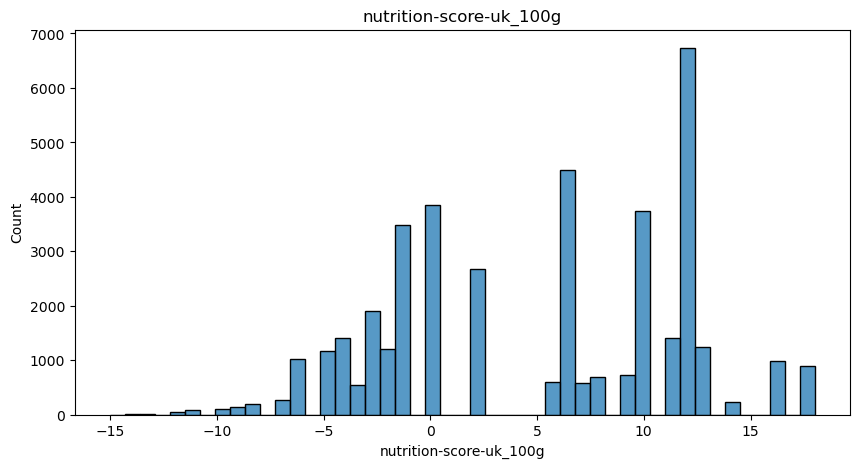

In [4]:
# Plot histogram of each variable to show the general descriptive picture of their behaviors and frequencies

columns = Data.columns[4:].tolist() # listing the interested features separately 

for cols in columns:
    
    plt.figure(figsize=(10,5)) #set figure size
    plt.grid(False) #set the background
    sns.histplot(data = Data, x = cols) # create a histogram plot
    plt.title(cols)
    # display plot
    plt.show()

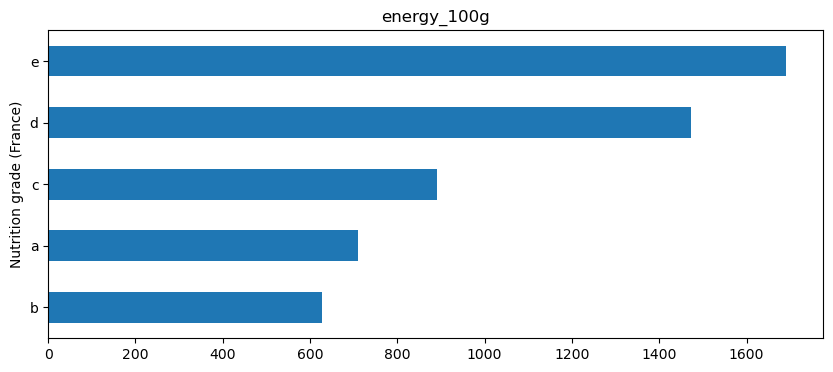

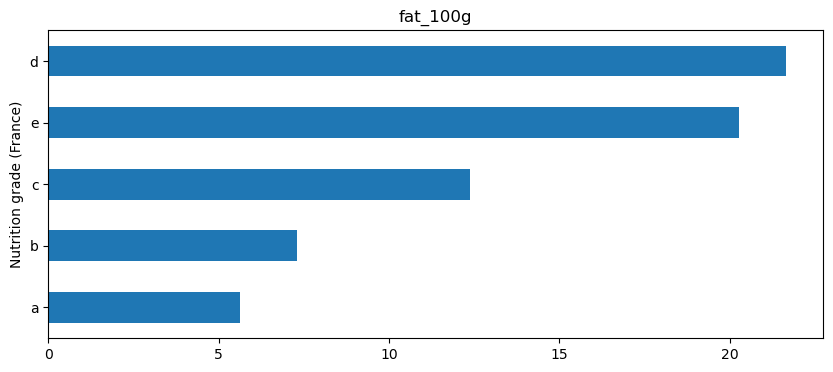

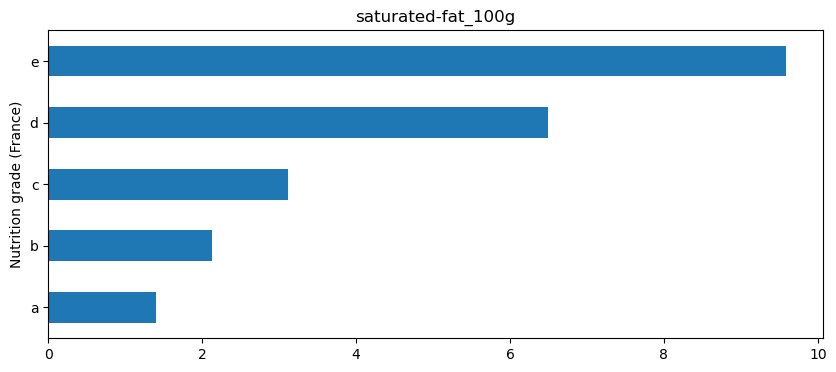

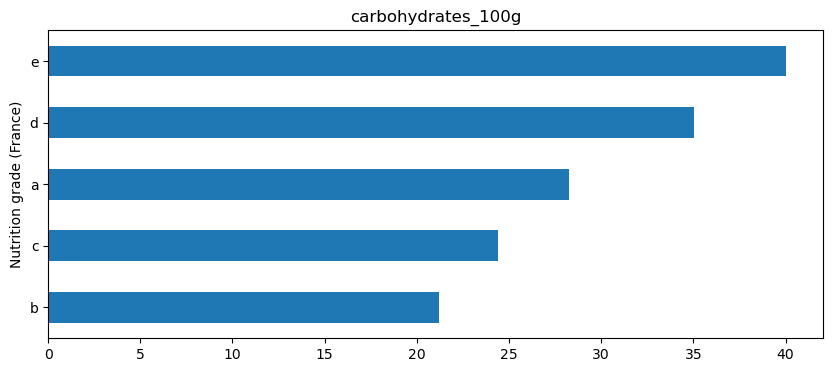

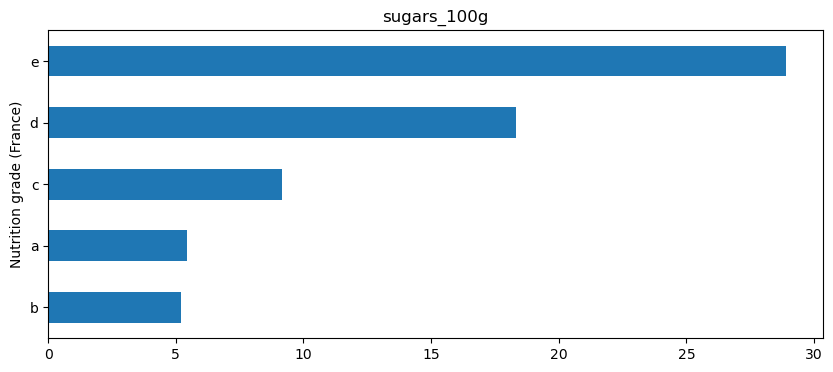

...

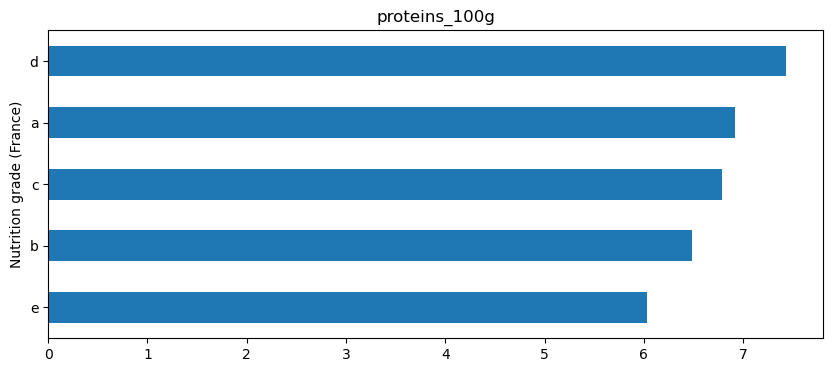

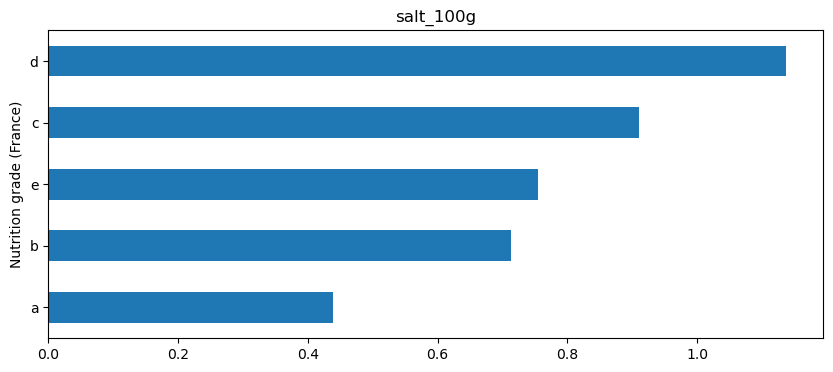

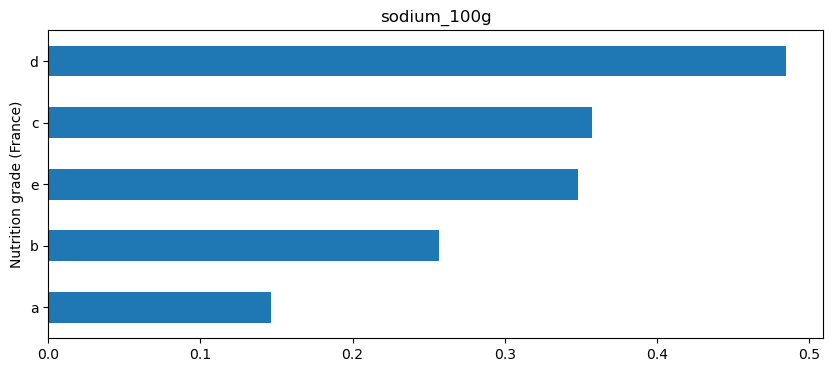

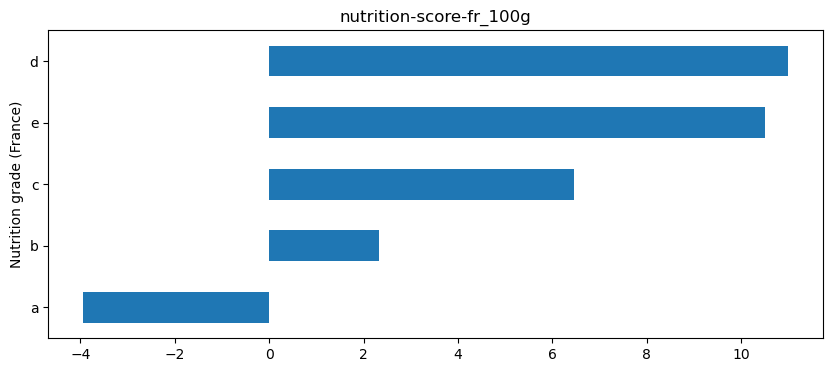

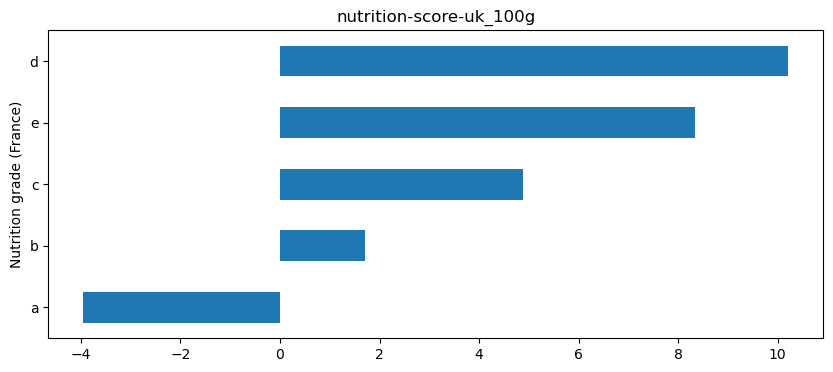

In [5]:
# Group by nutrition_grade_fr - influence of average means of each variable on nutrition grade 

Data_nutrition_gr = Data.groupby('nutrition_grade_fr').mean()

for col in Data_nutrition_gr.columns:
    plt.figure(figsize=(10,4))
    Data_nutrition_gr[col].sort_values().plot(kind = 'barh') # create a bar plot
    plt.ylabel('Nutrition grade (France)')
    plt.title(col)
    plt.show()  

In [6]:
# classify the products into categories 

Data.groupby('pnns_groups_1').count()

,code,product_name,pnns_groups_2,nutrition_grade_fr,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition-score-fr_100g,nutrition-score-uk_100g
pnns_groups_1,,,,,,,,,,,,,,,
Beverages,5155,5155,5155,5155,5155,5155,5155,5155,5155,5155,5155,5155,5155,5155,5155
Cereals and potatoes,5532,5532,5532,5532,5532,5532,5532,5532,5532,5532,5532,5532,5532,5532,5532
Composite foods,5156,5156,5156,5156,5156,5156,5156,5156,5156,5156,5156,5156,5156,5156,5156
Fat and sauces,2979,2979,2979,2979,2979,2979,2979,2979,2979,2979,2979,2979,2979,2979,2979
Fish Meat Eggs,4748,4748,4748,4748,4748,4748,4748,4748,4748,4748,4748,4748,4748,4748,4748
Fruits and vegetables,2736,2736,2736,2736,2736,2736,2736,2736,2736,2736,2736,2736,2736,2736,2736
Milk and dairy products,2060,2060,2060,2060,2060,2060,2060,2060,2060,2060,2060,2060,2060,2060,2060
Salty snacks,2297,2297,2297,2297,2297,2297,2297,2297,2297,2297,2297,2297,2297,2297,2297
Sugary snacks,8741,8741,8741,8741,8741,8741,8741,8741,8741,8741,8741,8741,8741,8741,8741


In [7]:
# Create a new column of the pnns_groups_1 variable called category
Data['Category'] = Data['pnns_groups_1']

# Format the classes of the products in the Category column 
# rename sugary-snacks (pasteries) as Snacks for clear distinction from the Sugary snacks group (buscuits and cakes)
Data.replace(Data.loc[Data['Category'] == 'sugary-snacks', 'Category'].tolist(), 'Pasteries', inplace = True)

# change fruits-and-vegetables to Legumes and vegetables
Data.replace(Data.loc[Data['Category'] == 'fruits-and-vegetables', 'Category'].tolist(), 
             'Legumes and vegetables', inplace = True)

# merge the cereals-and-potatoes with fewer products to Cereals and potatoes
Data.replace(Data.loc[Data['Category'] == 'cereals-and-potatoes', 'Category'].tolist(), 'Cereals and potatoes', inplace = True)

# change both Salty snacks and sugary snacks to Snacks
Data.replace(Data.loc[Data['Category'] == 'salty-snacks', 'Category'].tolist(), 'Sugary and salty Snacks', inplace = True)
Data.replace(Data.loc[Data['Category'] == 'Salty snacks', 'Category'].tolist(), 'Sugary and salty Snacks', inplace = True)
Data.replace(Data.loc[Data['Category'] == 'Sugary snacks', 'Category'].tolist(), 'Sugary and salty Snacks', inplace = True)

# Display the first 5 rows of the new dataframe
Data.head()

,code,product_name,pnns_groups_1,pnns_groups_2,nutrition_grade_fr,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition-score-fr_100g,nutrition-score-uk_100g,Category
0,0000001938067,Chaussons tressés aux pommes,Sugary and salty Snacks,Biscuits and cakes,c,1090.0,10.70,9.124302,38.700000,24.700000,3.520498,3.330000,0.647000,0.255000,9.000000,9.000000,Sugary and salty Snacks
1,0000008237798,Quiche Lorraine,Composite foods,Pizza pies and quiche,b,478.0,6.79,2.860000,7.860000,0.714000,0.357000,5.360000,0.499000,0.196000,2.131309,2.136796,Composite foods
2,0000020424640,Belgische Pralinen,Sugary and salty Snacks,Sweets,e,2257.0,33.30,21.100000,60.565619,51.500000,3.520498,4.700000,0.090000,0.035433,11.977283,11.978147,Sugary and salty Snacks
3,0000027533048,Luxury Christmas Pudding,Sugary and salty Snacks,Biscuits and cakes,c,1284.0,7.00,3.600000,54.200000,45.109926,4.700000,5.877508,0.199898,0.078700,10.000000,10.000000,Sugary and salty Snacks
4,0000040608754,"Pepsi, Nouveau goût !",Beverages,Sweetened beverages,e,177.0,0.00,0.000000,10.400000,10.400000,0.000000,0.000000,0.025400,0.028669,13.000000,-1.095729,Beverages


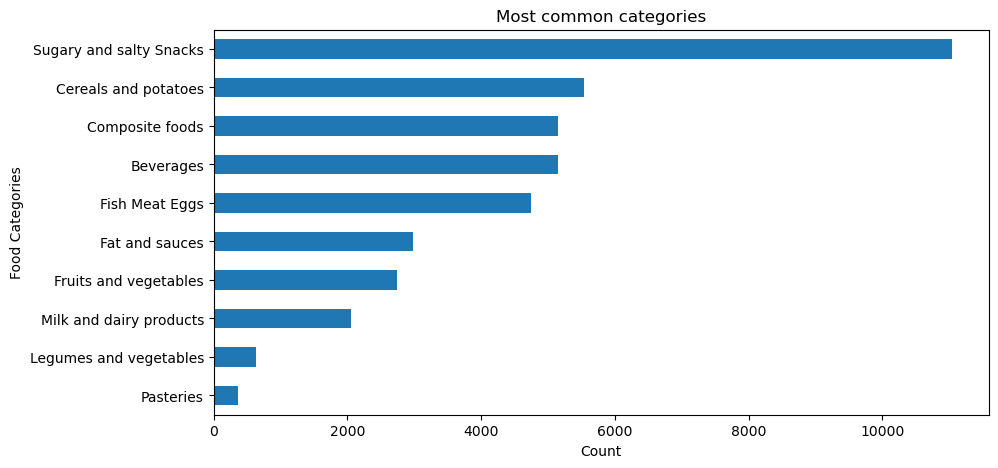

In [8]:
# Bar chat of number of food products in each category according to increasing frequency

Data_cat = Data.groupby('Category').count()
plt.figure(figsize=(10,5))
Data_cat['energy_100g'].sort_values().plot(kind = 'barh') # create a bar plot
plt.ylabel('Food Categories')
plt.xlabel('Count')
plt.title('Most common categories')
plt.show()  

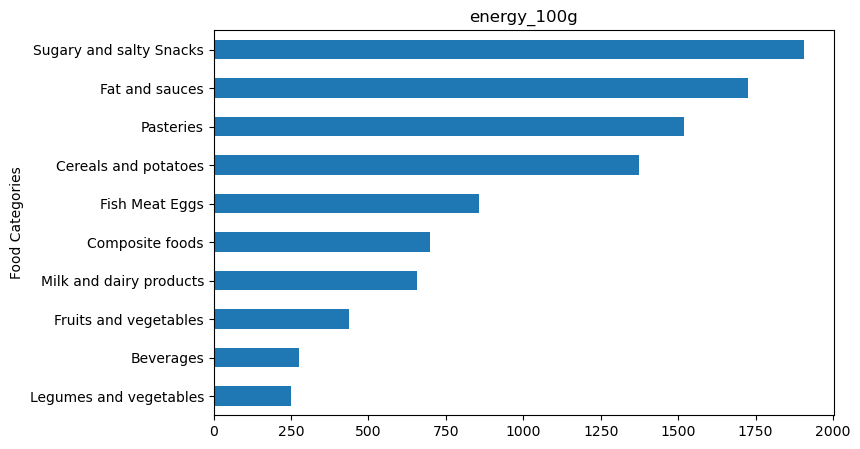

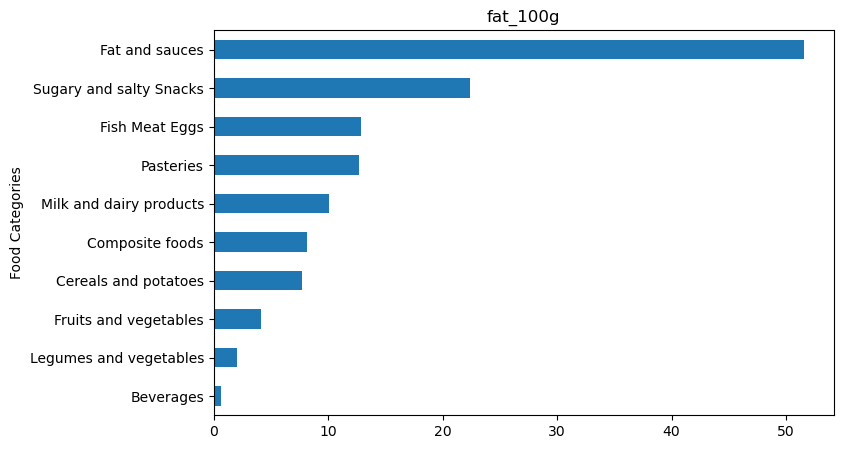

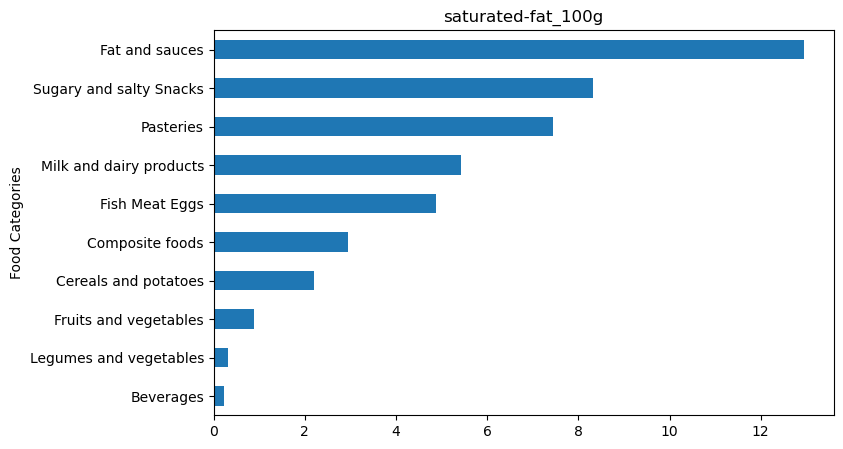

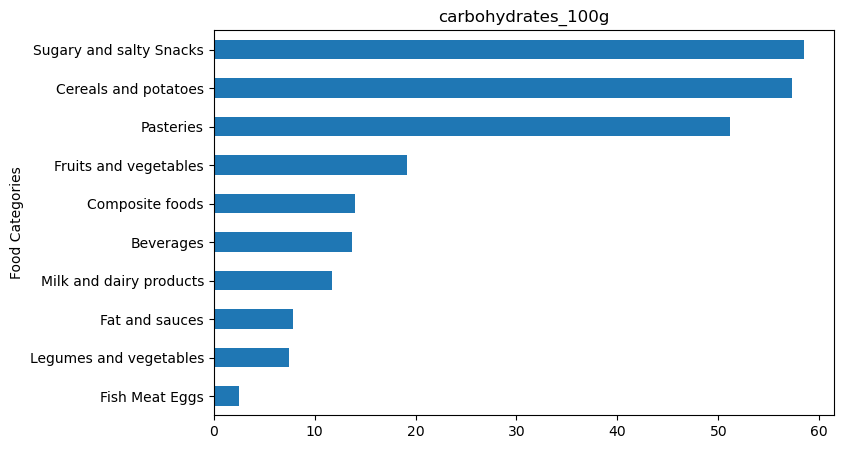

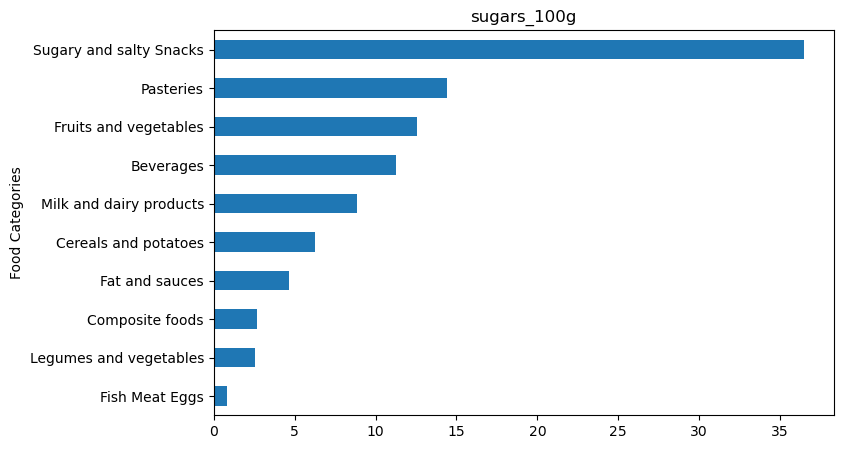

...

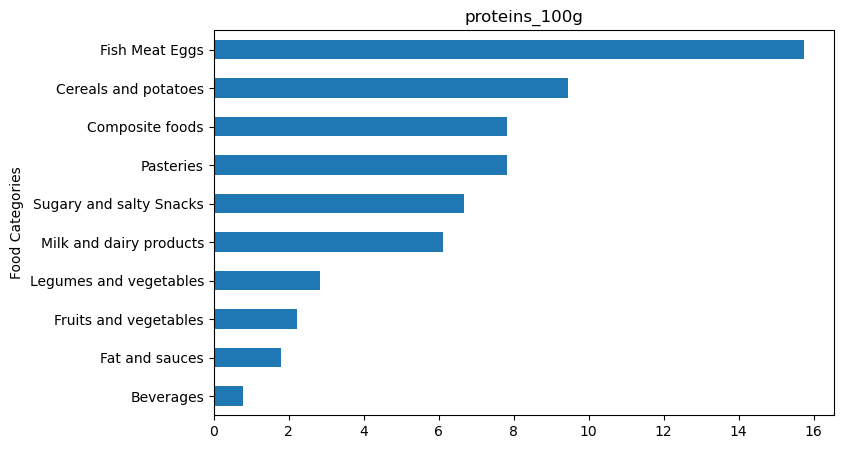

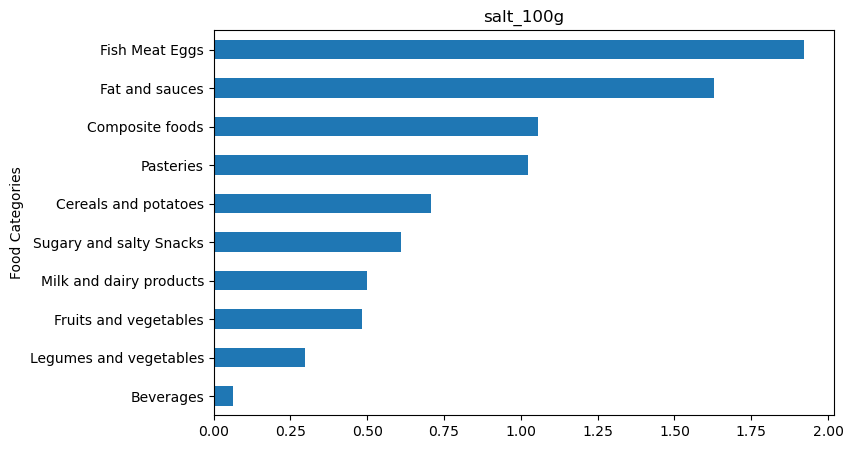

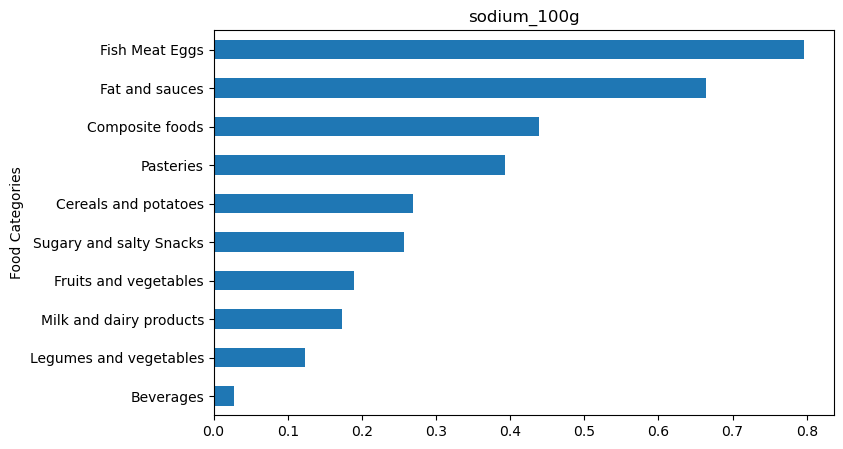

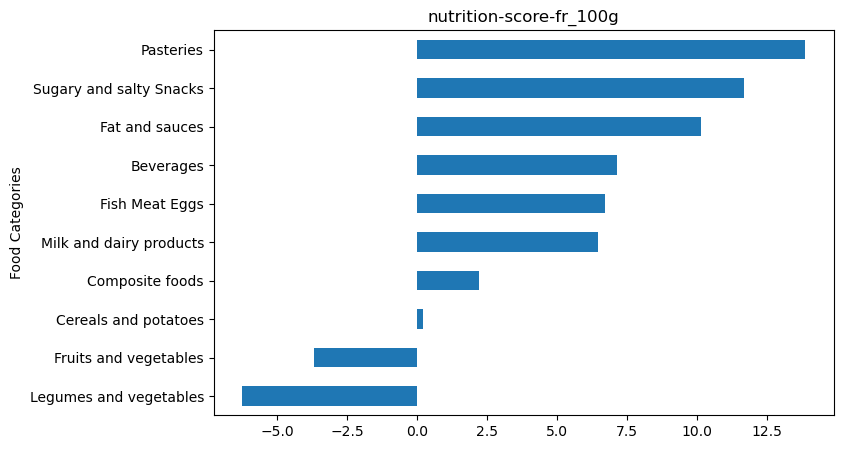

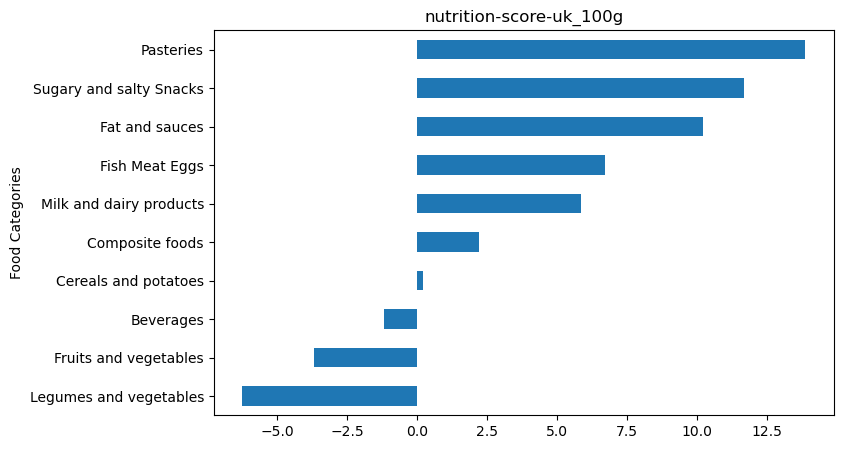

In [9]:
#Average nutrient present in each food category

Data_cat = Data.groupby('Category').mean()
cat_col = Data_cat.columns.tolist()

for i in cat_col:
    plt.figure(figsize=(8,5), dpi = 100)
    Data_cat[i].sort_values().plot(kind = 'barh') # create a bar plot
    plt.ylabel('Food Categories')
    plt.title(i)
    plt.show()

##### Narratives:
 - the influence of food categories  show that legumes, vegetables, fruits, and cereals and potatoes have the lowest nutritional score and grade while pasteries, snacks, fats,and sauces greatly inceases the nutritional score value and grade

#### 2.2. Bivariate analysis
 - relationships between variables and show the influence of one variable on the other

###### - Boxplots
- to understand the relationship between the numeric variables and a categorical variable 

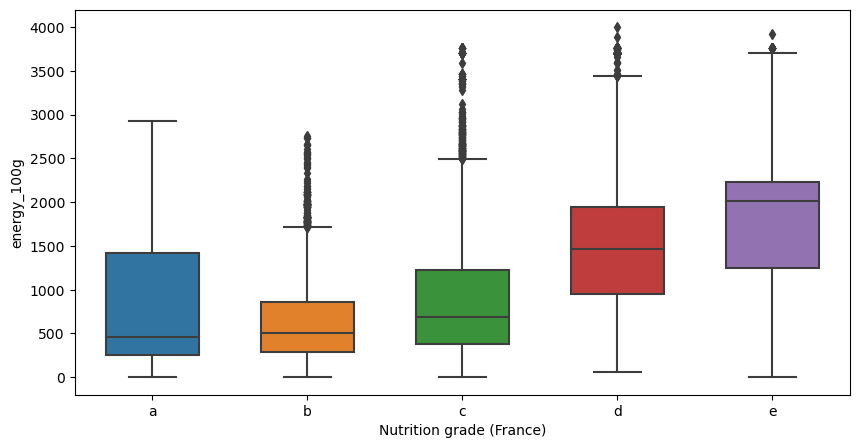

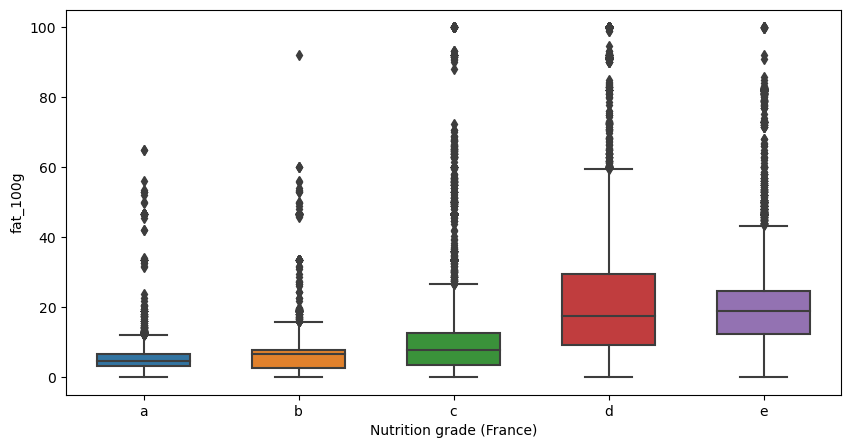

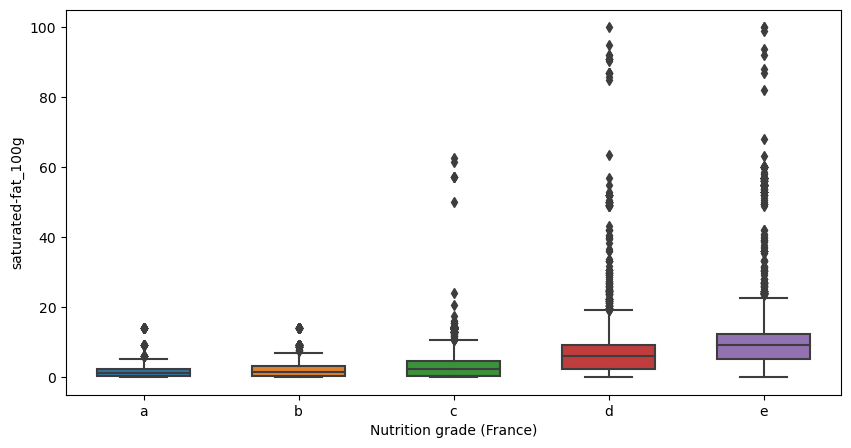

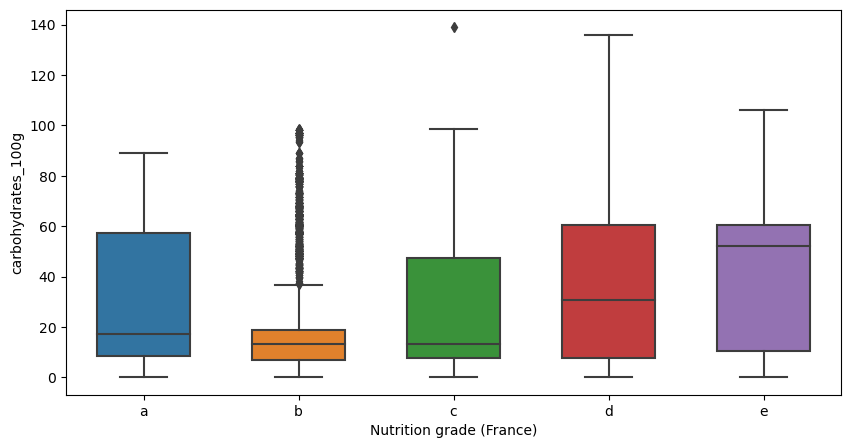

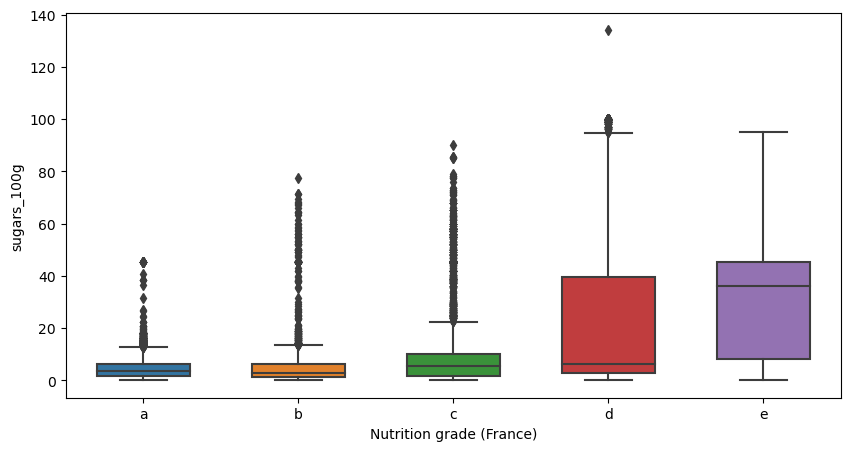

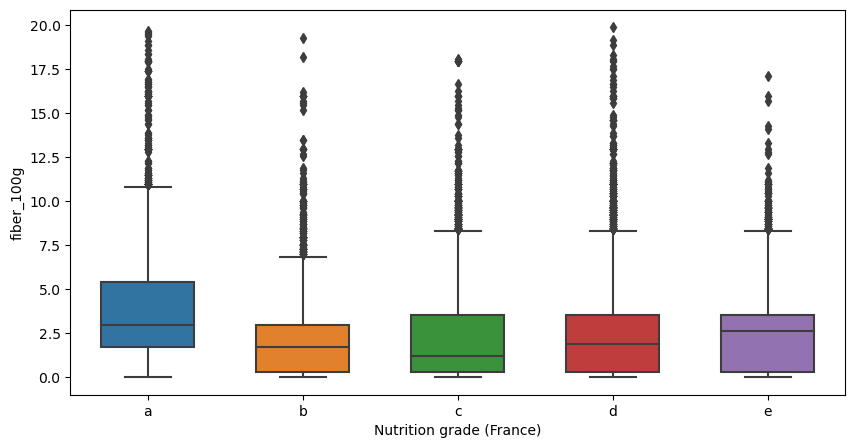

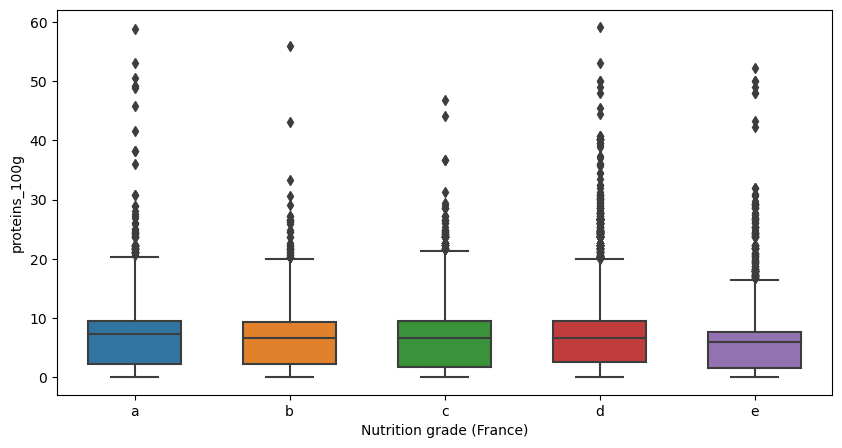

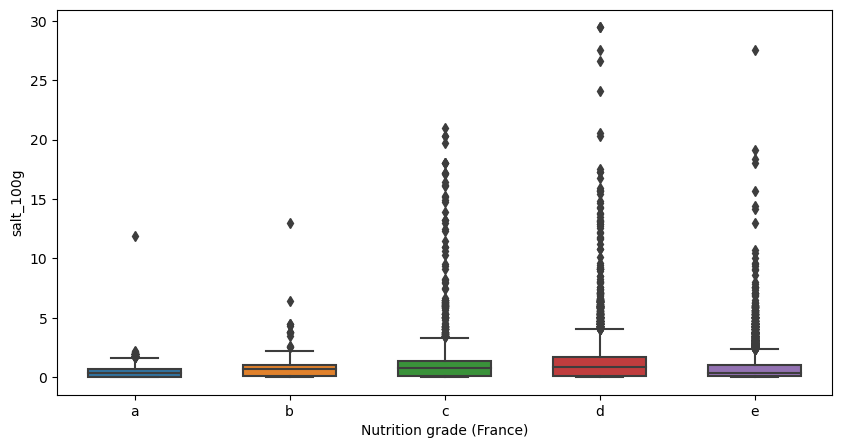

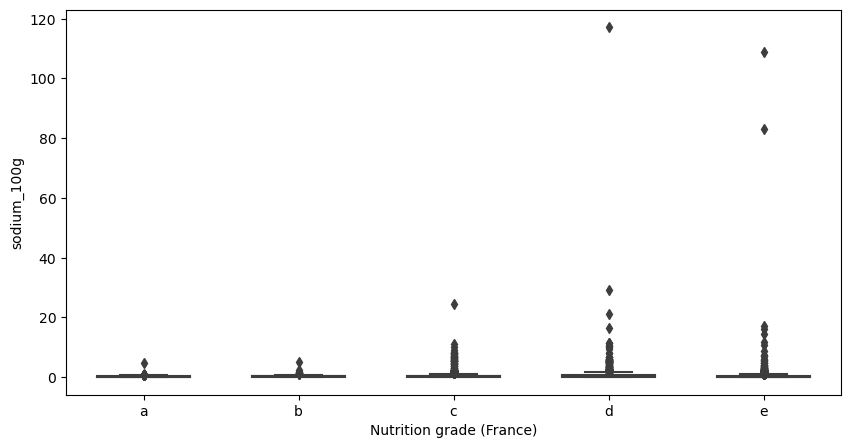

In [10]:
# create lists of numerical variables 

Col_bp = Data.columns[5:14].tolist()

# visualize the relationships between the numerical variables and categorical variable (nutrition grade)

for col in Col_bp:
    plt.figure(figsize=(10,5))
    plt.grid(False)
    # create a box plot
    sns.boxplot(data = Data, x = 'nutrition_grade_fr', y = col, order = ['a','b','c','d','e'], width=.6) 
    plt.xlabel('Nutrition grade (France)')
    plt.show()

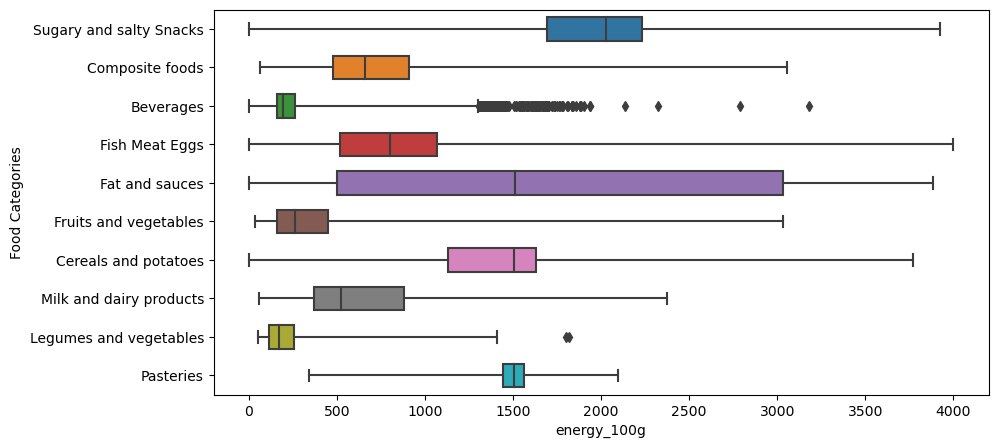

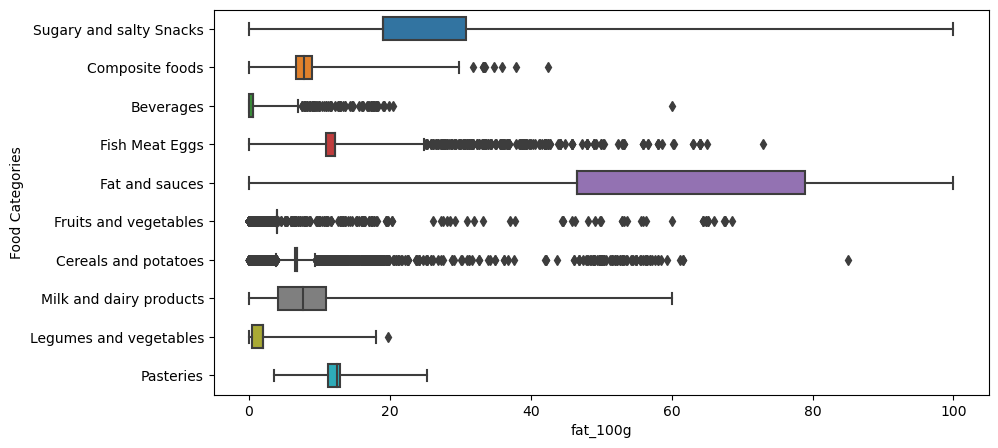

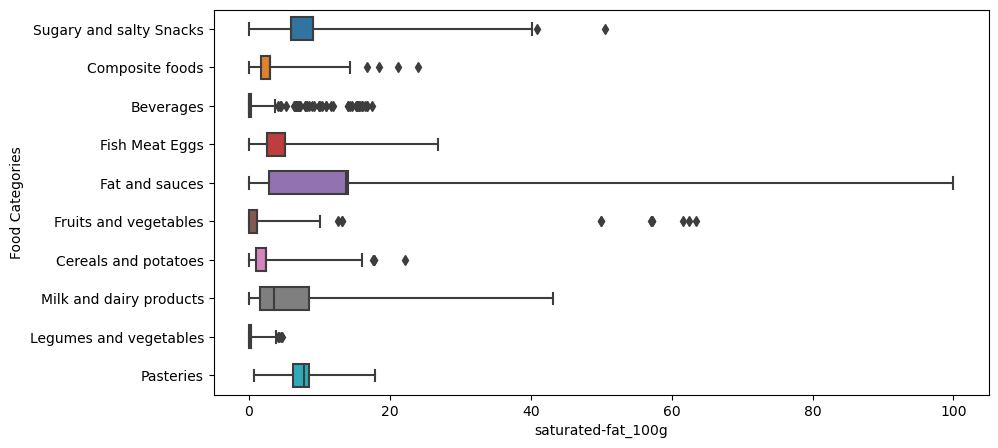

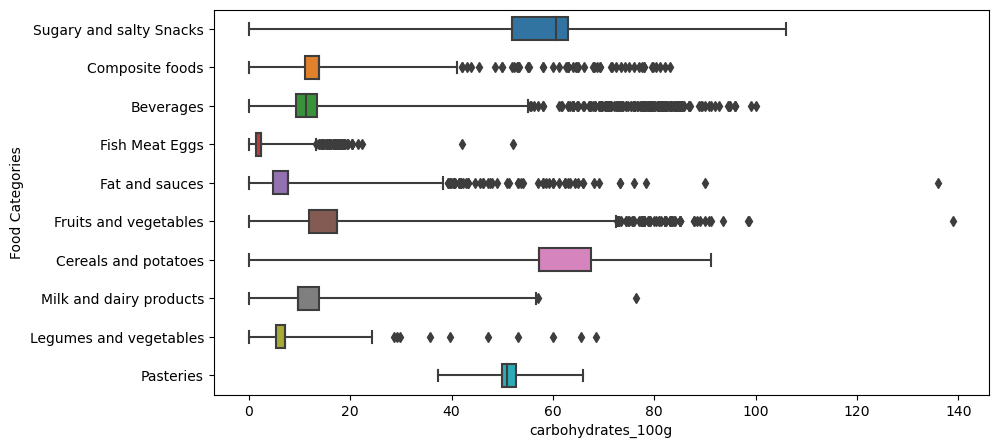

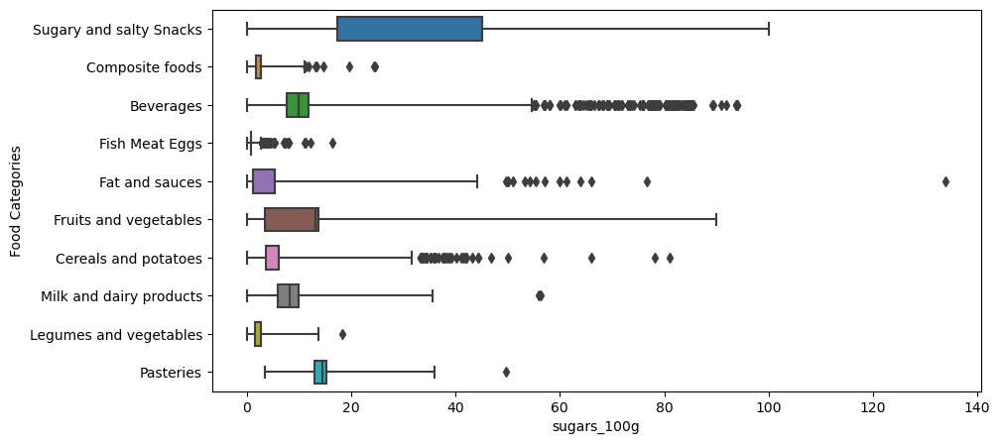

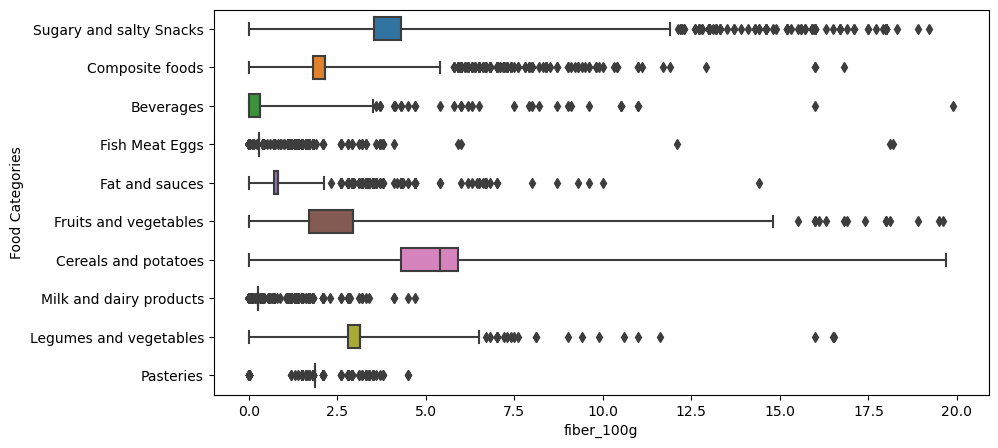

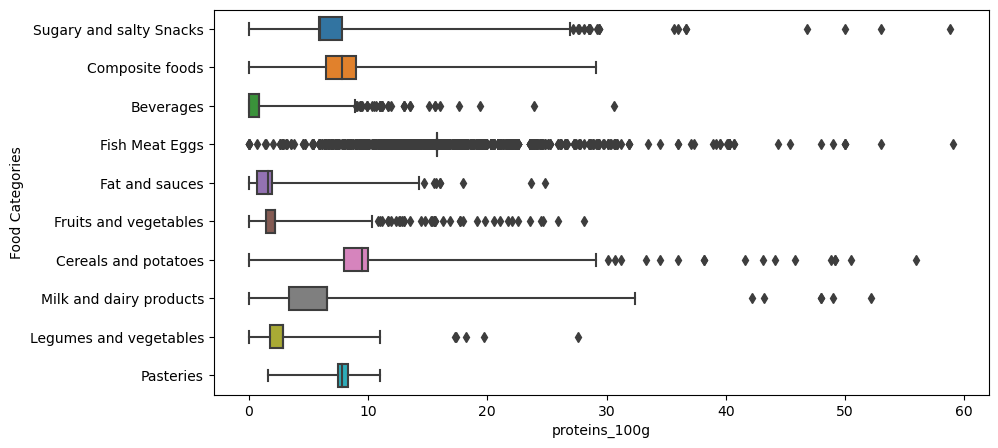

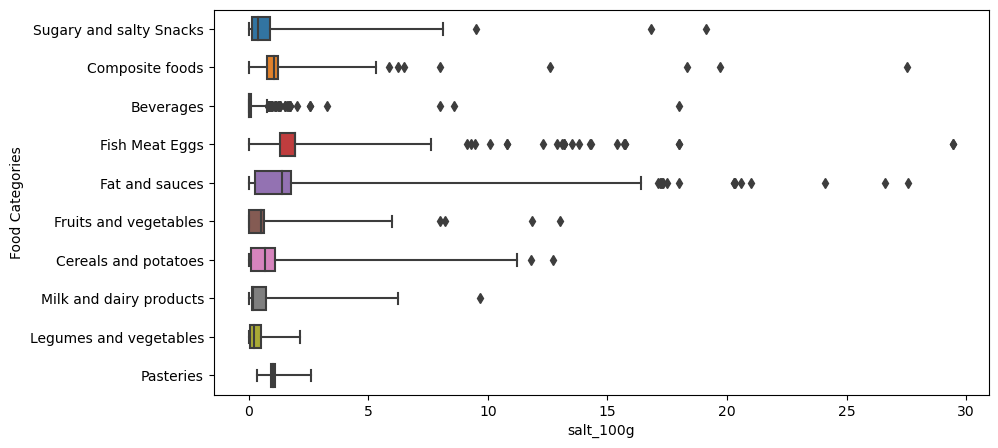

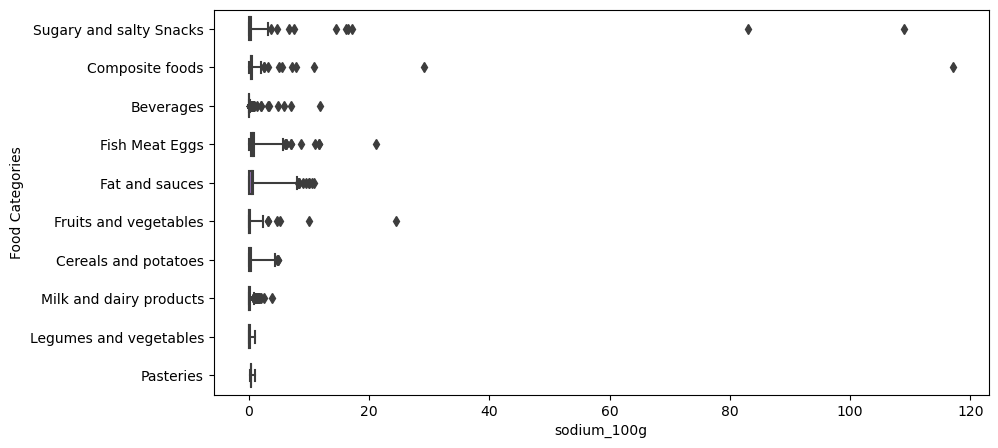

In [11]:
# visualize the relationships between the numerical variables and Category group

for col in Col_bp:
    plt.figure(figsize=(10,5))
    plt.grid(False)
    sns.boxplot(data = Data, y = 'Category', x = col, width=.6, whis = 10, orient = 'h') # create a box plot
    plt.ylabel('Food Categories')
    plt.xlabel(col)
    plt.show()

#### 2.2.1 Correlation heatmap
- visualize summary of correlation coefficients between variables

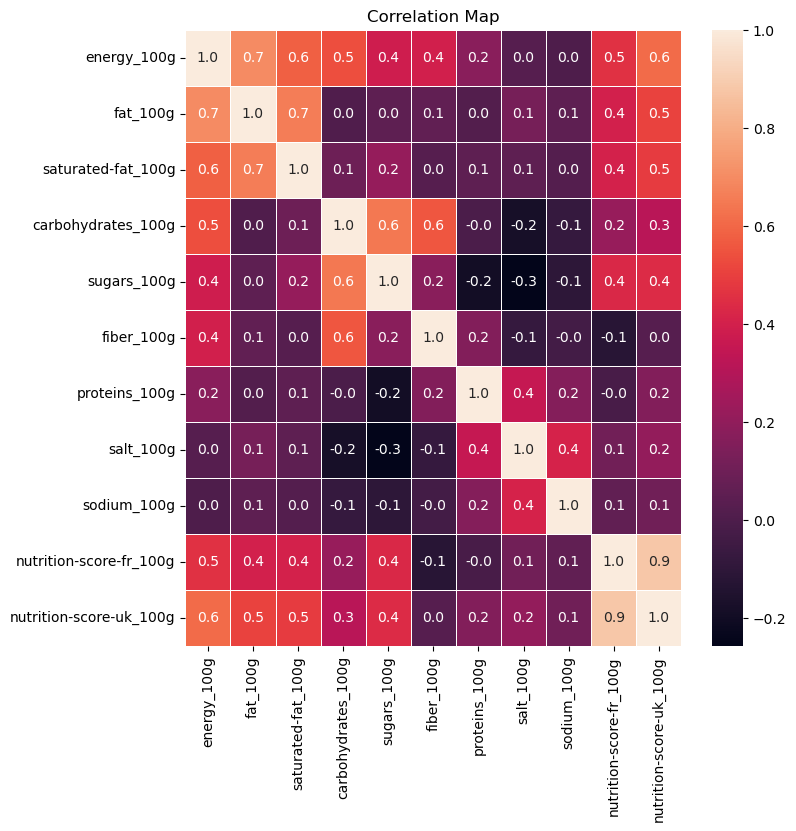

In [12]:
f, ax = plt.subplots(figsize=(8, 8), dpi = 100)
sns.heatmap(Data.corr(), annot=True, linewidths=.5, fmt= '.1f',ax=ax)
plt.title('Correlation Map')
plt.show()

#### 2.2.2 Scatter plots 
- to efficiently grasp which numerical variables are strongly correlated with each other

Influence of energy and nutrients on nutrition grade

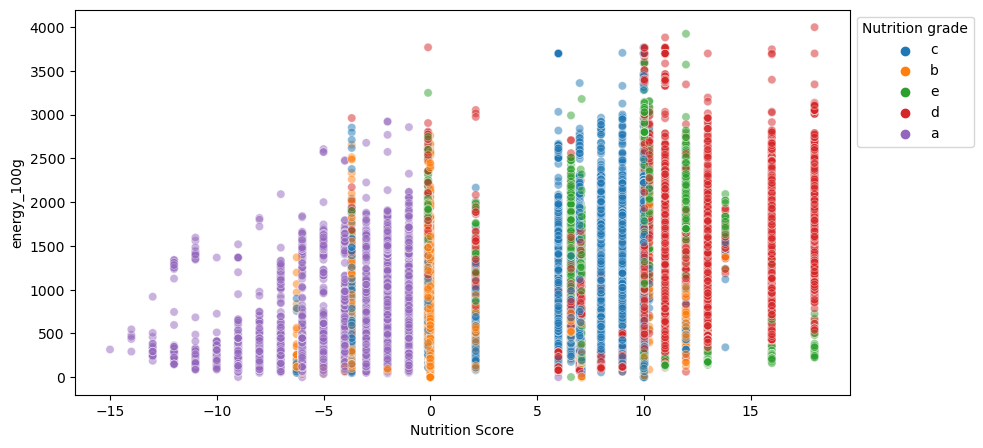

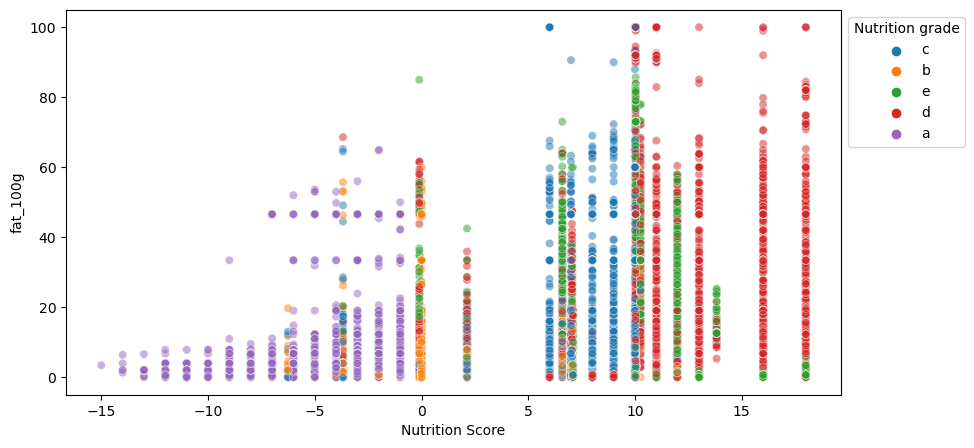

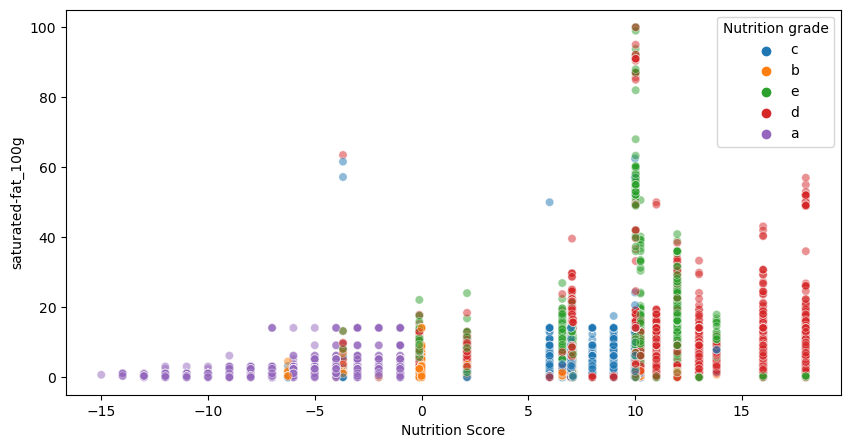

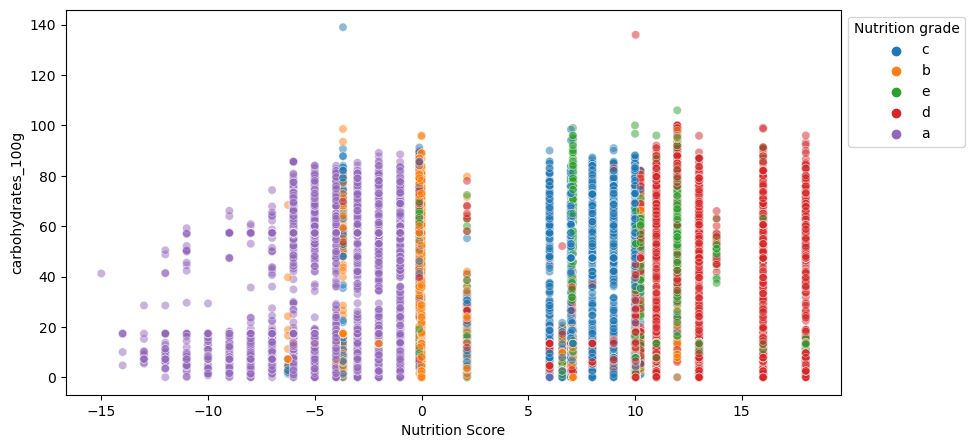

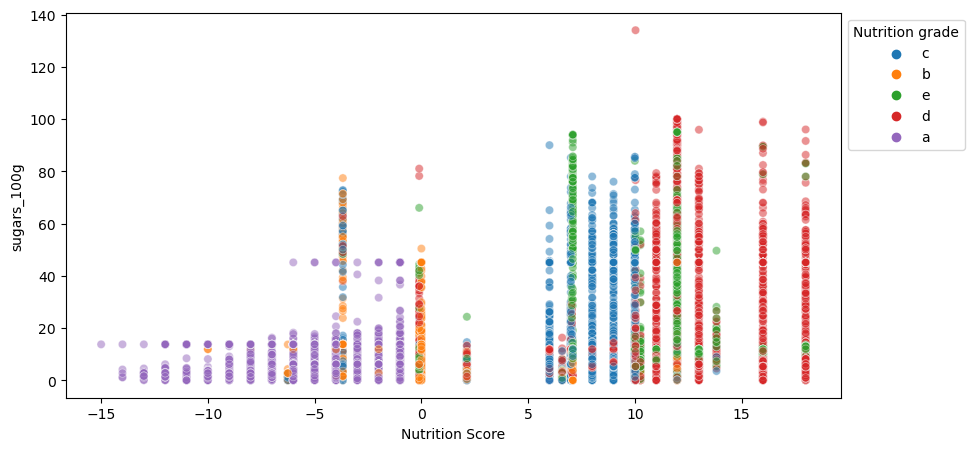

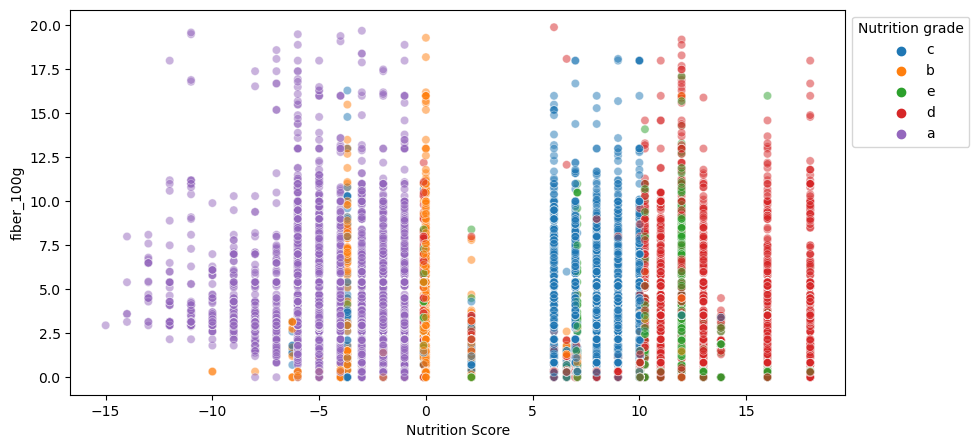

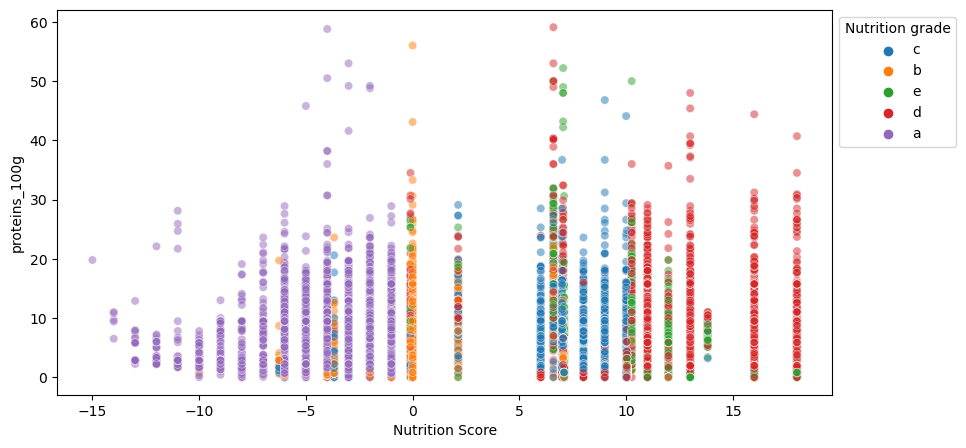

In [13]:
# visualize the relationships between essential numerical variables and nutrition score_fr
#plot line plots

# list of variables
lst = ['energy_100g', 'fat_100g', 'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g', 'proteins_100g'] 

for i in lst:
    plt.figure(figsize=(10,5))
    plt.grid(False)
    sns.scatterplot(x = 'nutrition-score-fr_100g', y = i, data = Data, hue = 'nutrition_grade_fr', alpha = 0.5)
    plt.legend(bbox_to_anchor = (1,1), title = 'Nutrition grade')
    plt.xlabel('Nutrition Score')
    plt.ylabel(i)
    plt.show()

Influence of nutrients on energy value

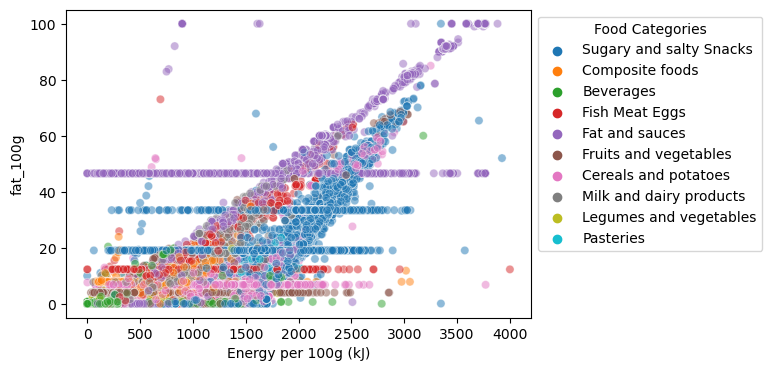

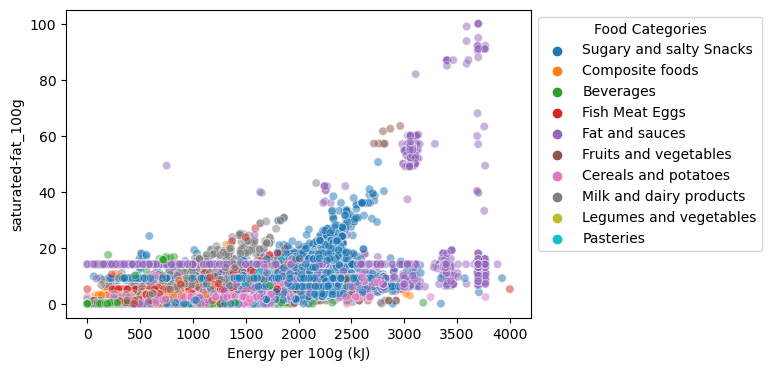

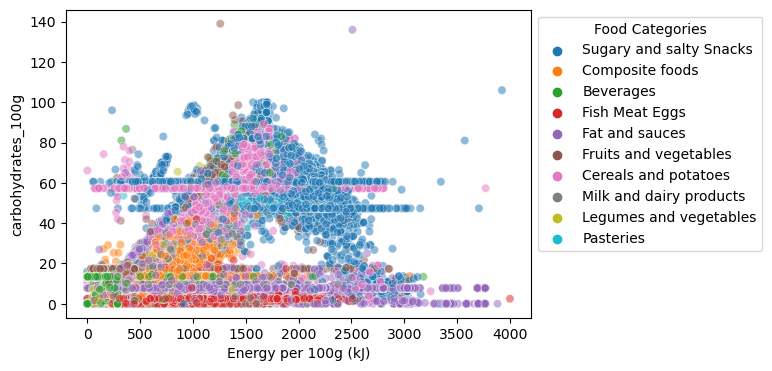

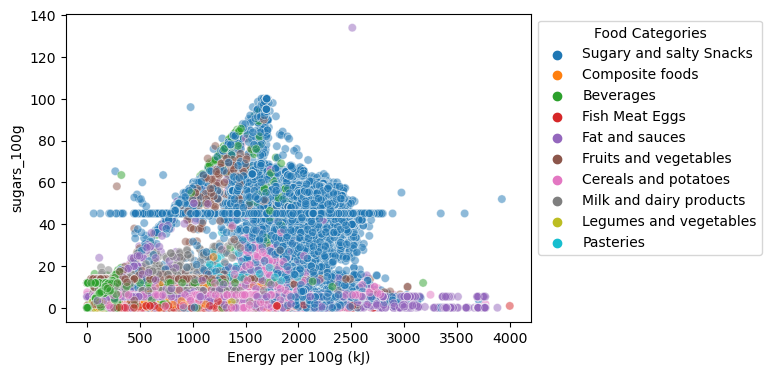

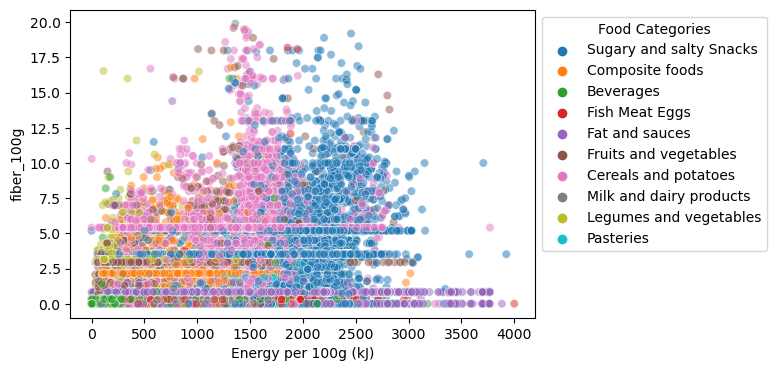

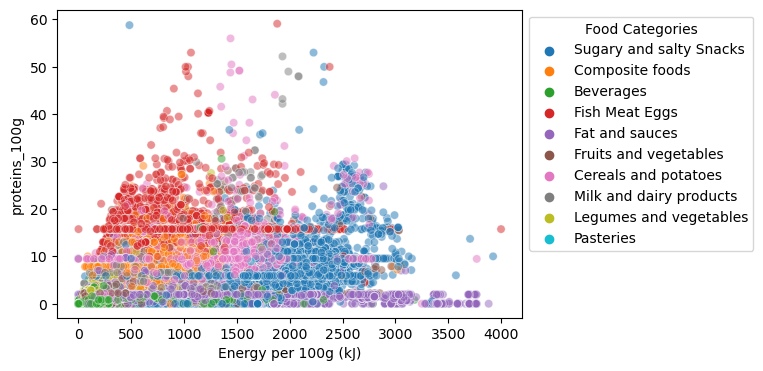

In [14]:
# Influence of nutrients on energy

# list of essential nutrients

lst_energy = ['fat_100g', 'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g', 'proteins_100g'] 

for i in lst_energy:
    plt.figure(figsize=(6,4), dpi = 100)
    plt.grid(False)
    sns.scatterplot(x = 'energy_100g', y = i, data = Data, alpha = 0.5, hue = 'Category') 
    plt.legend(bbox_to_anchor = (1,1), title = 'Food Categories')
    plt.xlabel('Energy per 100g (kJ)')
    plt.ylabel(i)
    plt.show()

Influence of nutrients on carbohydrate

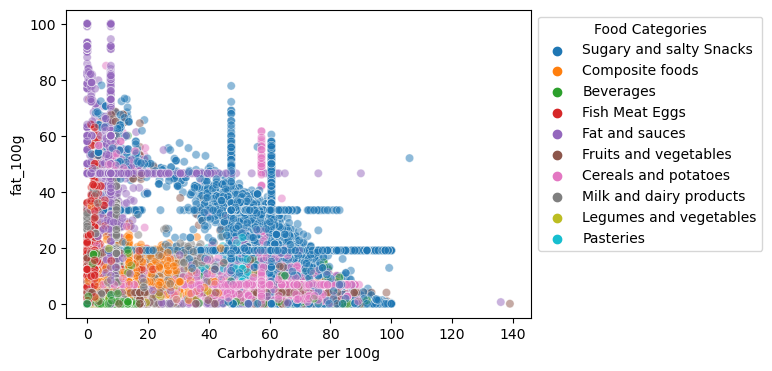

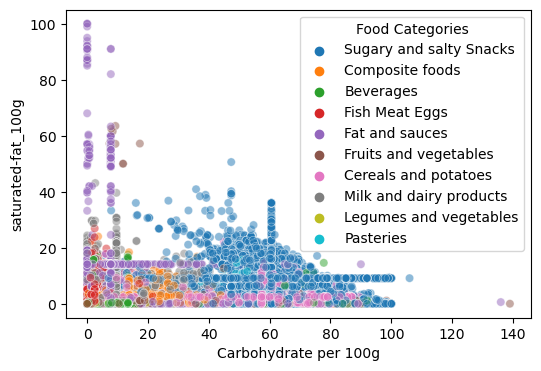

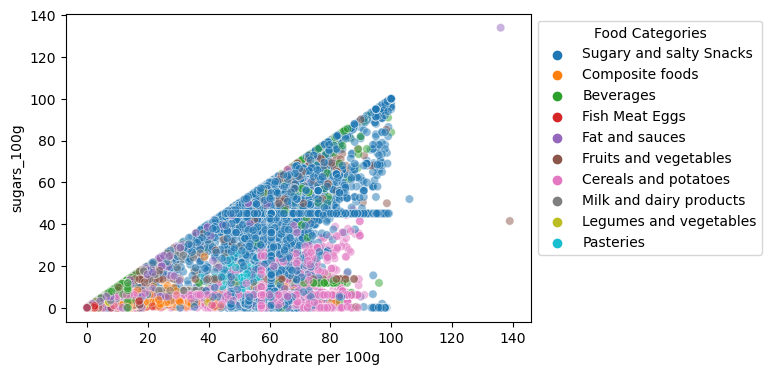

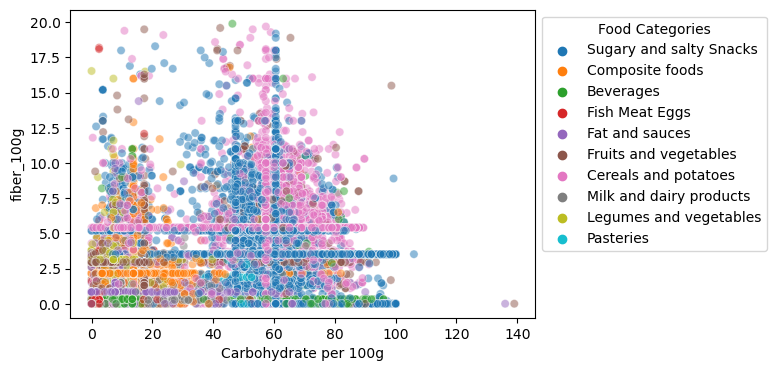

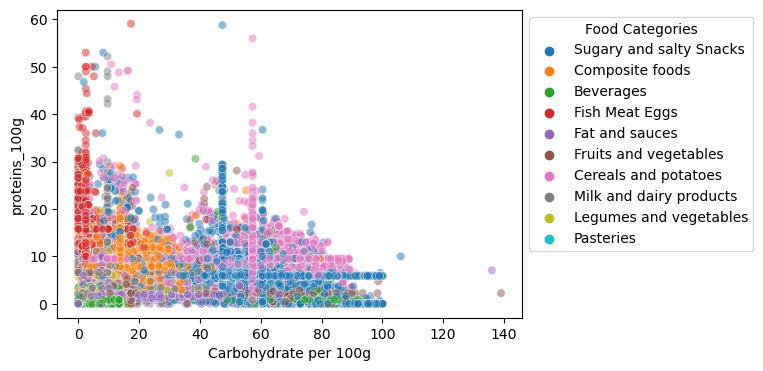

In [15]:
# list of essential nutrients

lst_carb = ['fat_100g', 'saturated-fat_100g', 'sugars_100g', 'fiber_100g', 'proteins_100g'] 

for i in lst_carb:
    plt.figure(figsize=(6,4), dpi = 100)
    plt.grid(False)
    sns.scatterplot(x = 'carbohydrates_100g', y = i, data = Data, alpha = 0.5, hue = 'Category') 
    plt.legend(bbox_to_anchor = (1,1), title = 'Food Categories')
    plt.xlabel('Carbohydrate per 100g')
    plt.ylabel(i)
    plt.show()

Scatter pairplots between other variables

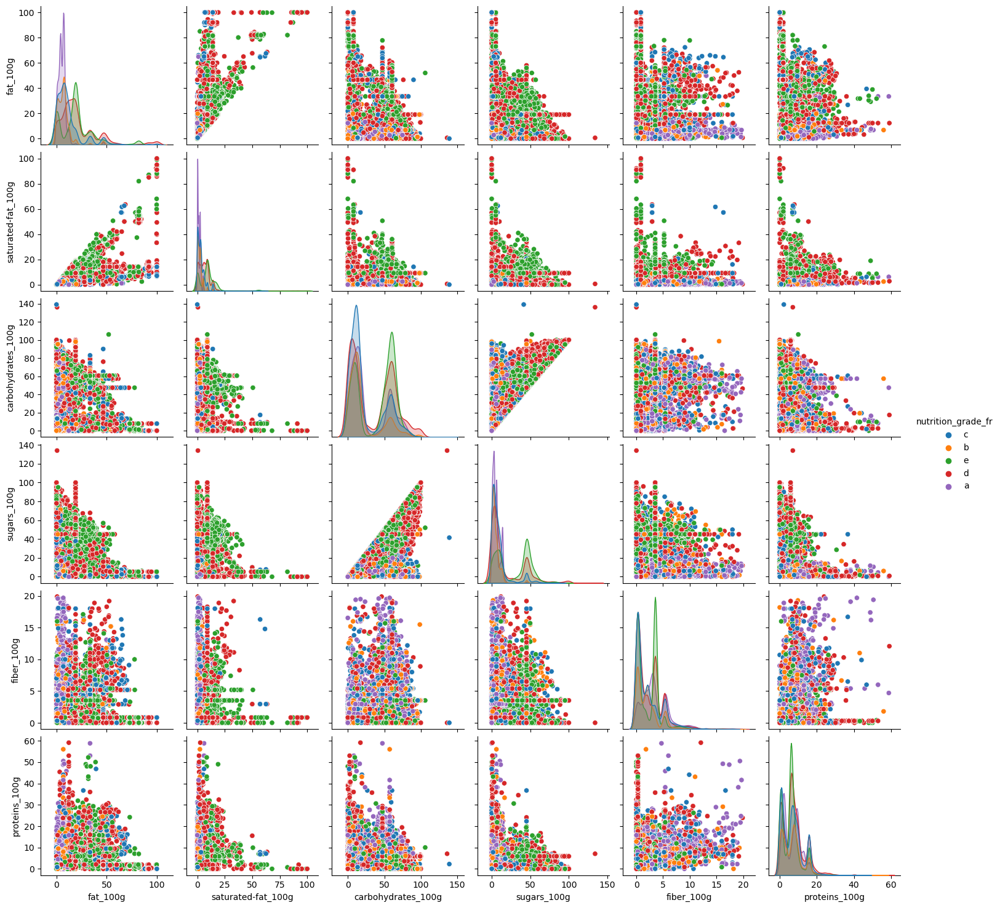

In [16]:
# create list of variables 
lst_pair = ['fat_100g', 'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g', 
            'proteins_100g', 'nutrition_grade_fr'] 

# create pair plots of variables
sns.pairplot(Data.loc[:,lst_pair], hue = 'nutrition_grade_fr', height=2.5)
plt.show()

Distribution of food categories according to nutritional grade

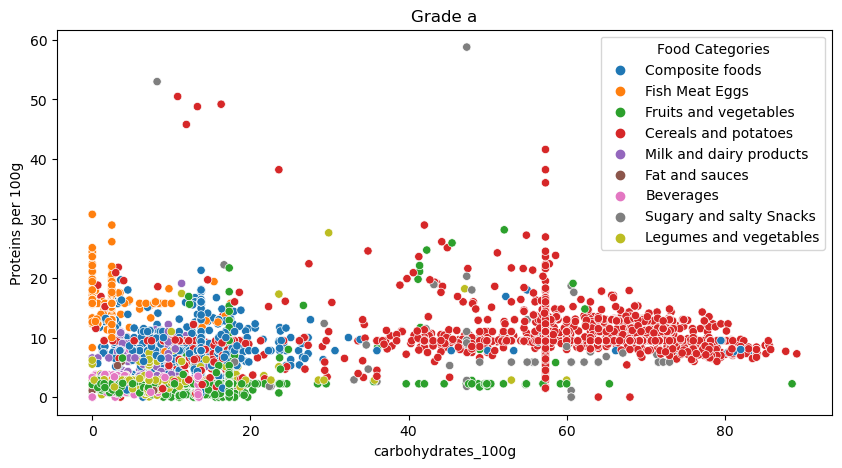

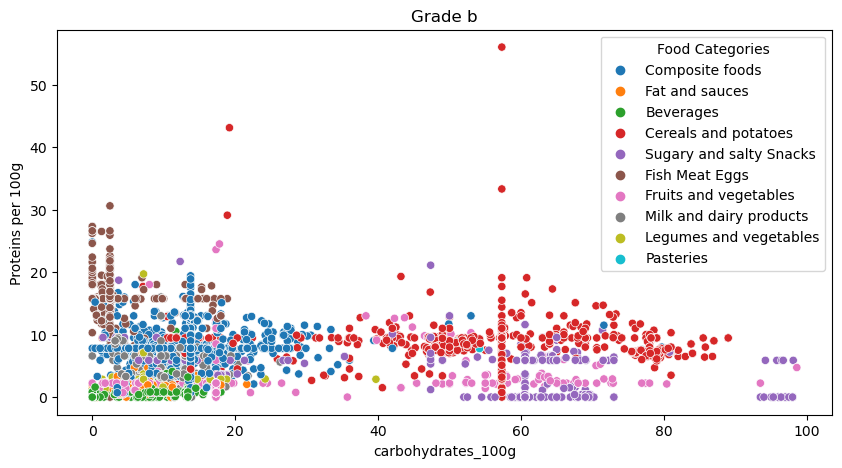

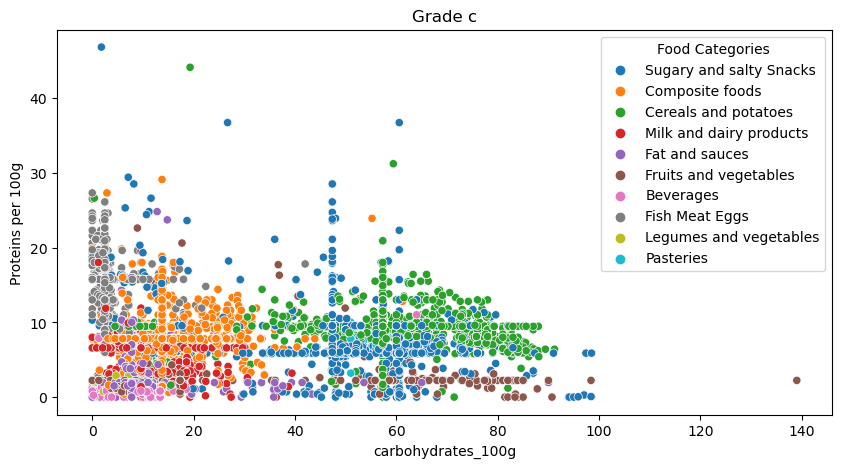

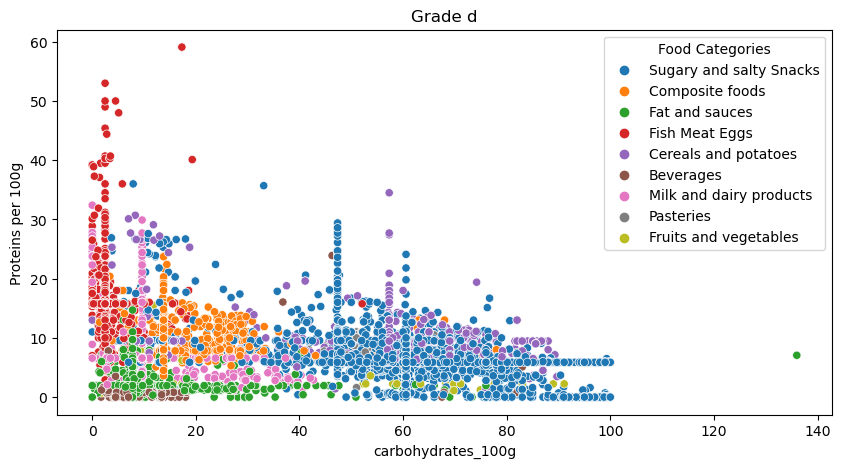

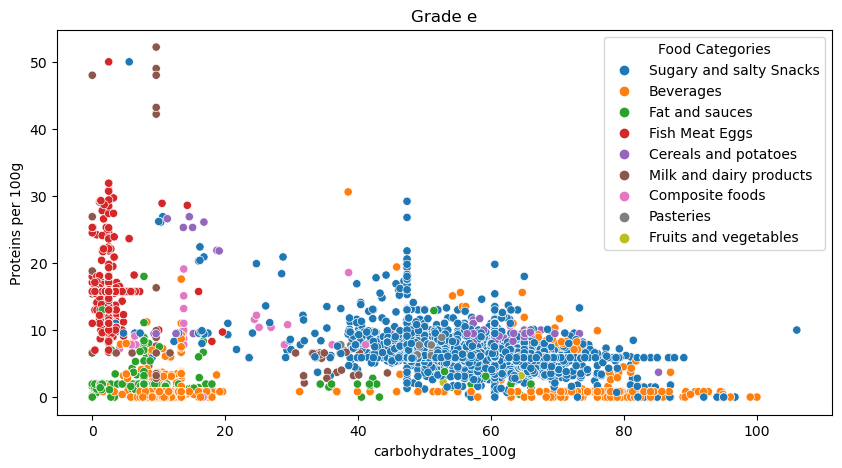

In [17]:
# Proteins against sugars

grade = ['a','b','c','d','e']

for i in grade:
    plt.figure(figsize=(10,5))
    plt.grid(False)
    df = Data[Data['nutrition_grade_fr'] == i]
    sns.scatterplot(x = 'carbohydrates_100g', y = 'proteins_100g', data = df, hue = df['Category'])
    plt.legend(bbox_to_anchor = (1,1), title = 'Food Categories')
    plt.xlabel('carbohydrates_100g')
    plt.ylabel('Proteins per 100g')
    plt.title('Grade' + ' ' + i)
    plt.show()

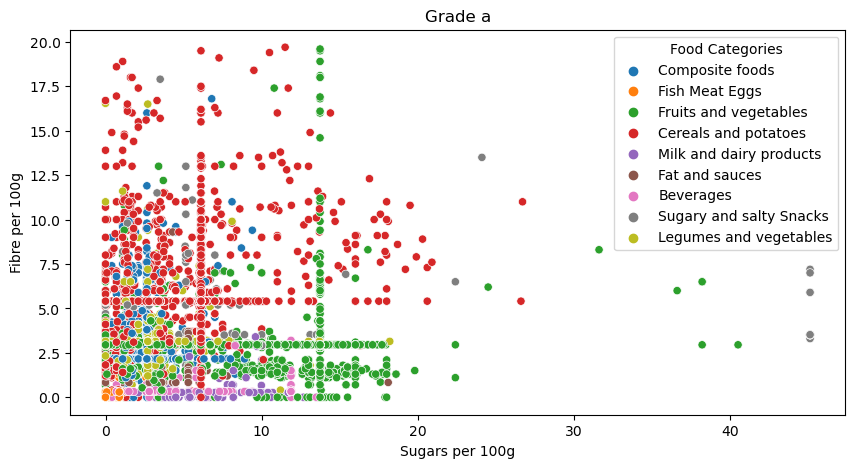

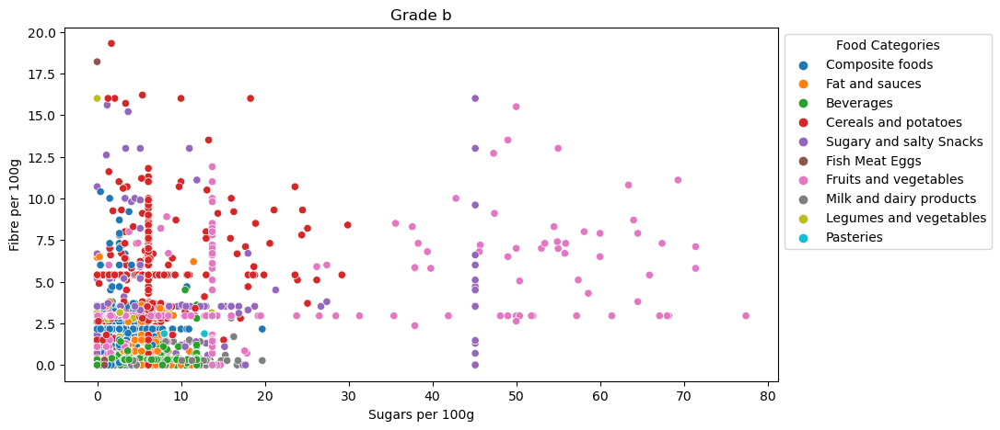

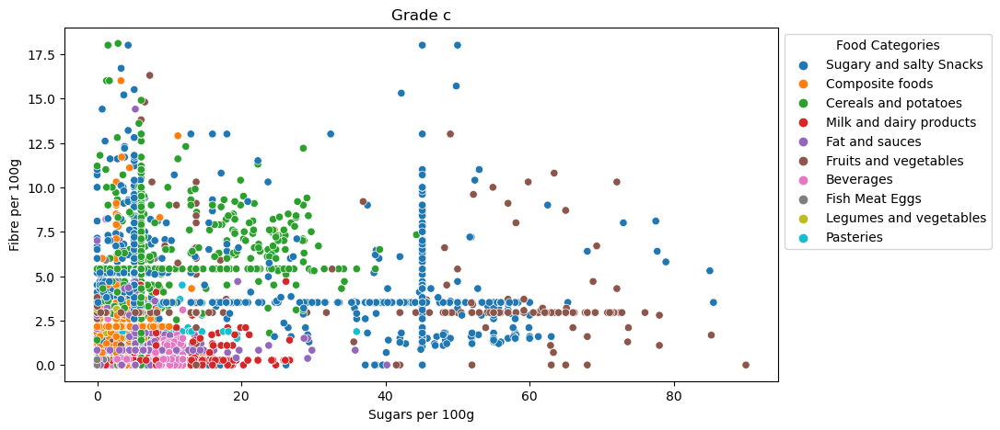

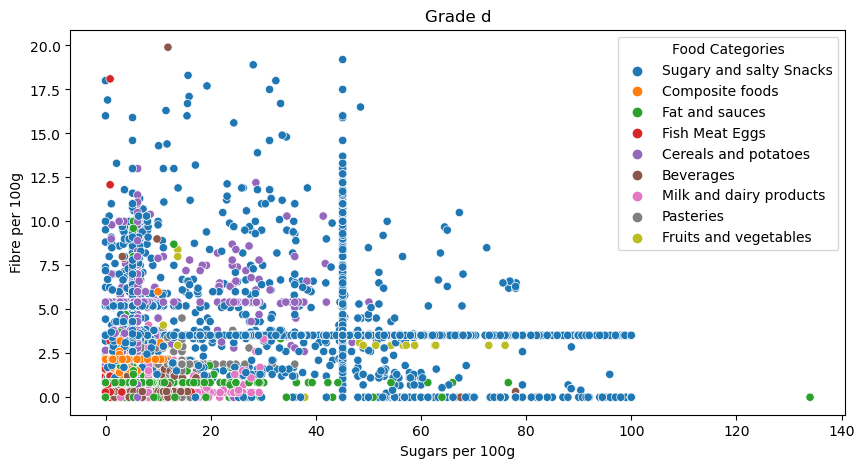

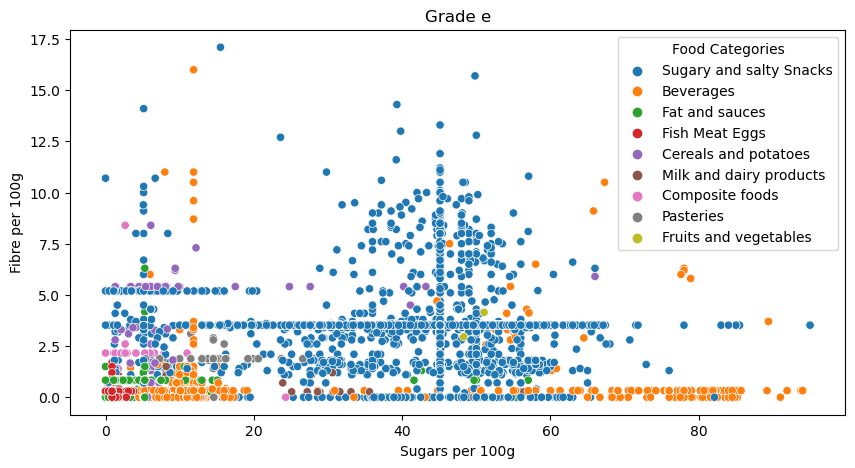

In [18]:
# Fiber against sugars

for i in grade:
    plt.figure(figsize=(10,5))
    plt.grid(False)
    df = Data[Data['nutrition_grade_fr'] == i]
    sns.scatterplot(x = 'sugars_100g', y = 'fiber_100g', data = df, hue = df['Category'], facecolor = '#A9DFBF')
    plt.legend(bbox_to_anchor = (1,1), title = 'Food Categories')
    plt.xlabel('Sugars per 100g')
    plt.ylabel('Fibre per 100g')
    plt.title('Grade' + ' ' + i)
    plt.show()

Narratives -
- Nutrition score fr and uk are near-equivalent with the exception of some products nutritional scores increases with increasing nutrition_grade (i.e., from a to e)
- No significant relationships/correlations amongst most of the essential nutrients variables
- Fats show display good relationship with energy in many of the food products
- Saturated fats and sugars are positively correlated with fats and carbohydrate respectively

#### 2.3. Multivariate Analysis
 - Principal Component Analysis: reduce the dimensions of the variable and understand the important factors that influence the variables

##### Standardizing the data

In [19]:
# Data standardization 

# list of numerical variable

col = (['energy_100g', 'fat_100g', 'saturated-fat_100g', 'carbohydrates_100g',
       'sugars_100g', 'fiber_100g', 'proteins_100g', 'salt_100g',
       'nutrition-score-fr_100g'])

# create dataframe of relevant numerical variables 

df = Data[col]

#df = Data[Data.columns[5:-2]].drop(columns = 'sodium_100g', axis = 1).values

# apply scaler to normalize the columns
scaled_Data = StandardScaler().fit_transform(df) 
scaled_Data

array([[-0.06419005, -0.22770225,  0.63874876, ..., -0.64285462,
        -0.15548077,  0.45750838],
       [-0.8170845 , -0.46017125, -0.31289145, ..., -0.26370863,
        -0.28585259, -0.60699558],
       [ 1.37147632,  1.11598043,  2.45803448, ..., -0.38697777,
        -0.64613686,  0.91892518],
       ...,
       [ 1.24599391,  1.12314933, -0.23085746, ...,  0.19201363,
         0.46378534,  0.45750838],
       [ 0.61612143, -0.69739664, -0.38226562, ...,  1.16322502,
        -0.12641138, -1.55722083],
       [-1.05121428, -0.82533601, -0.6915977 , ..., -1.11340255,
        -0.7030424 ,  0.16190709]])

In [20]:
# display dataframe of the standardized data

colu = Data[Data.columns[5:-2]].drop(columns = 'sodium_100g', axis = 1).columns
df_normalized = pd.DataFrame(scaled_Data, columns = [colu])
df_normalized

,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,nutrition-score-fr_100g
0,-0.064190,-0.227702,0.638749,0.299696,0.538065,0.419178,-0.642855,-0.155481,0.457508
1,-0.817084,-0.460171,-0.312891,-0.856807,-0.727536,-0.855438,-0.263709,-0.285853,-0.606996
2,1.371476,1.115980,2.458034,1.119658,1.952145,0.419178,-0.386978,-0.646137,0.918925
3,0.174473,-0.447686,-0.200475,0.880947,1.614978,0.894415,-0.167053,-0.549329,0.612488
4,-1.187381,-0.863871,-0.747368,-0.761557,-0.216462,-0.999278,-1.264803,-0.703042,1.077425
...,...,...,...,...,...,...,...,...,...
40416,1.191864,2.305080,-0.170092,-0.911557,-0.485560,-0.664402,-0.947292,0.816194,0.617260
40417,-0.136773,-0.786579,-0.552917,2.422576,1.614978,-0.406995,-1.264056,-0.404723,0.918925
40418,1.245994,1.123149,-0.230857,0.624363,-0.670234,1.092207,0.192014,0.463785,0.457508
40419,0.616121,-0.697397,-0.382266,1.653449,-0.628023,1.377911,1.163225,-0.126411,-1.557221


In [21]:
# check the dimension of the standardized dataframe

scaled_Data.shape

(40421, 9)

In [22]:
# verify the mean and standard deviation of standardized data

np.mean(scaled_Data),np.std(scaled_Data)

(3.828218451052111e-18, 1.0000000000000002)

#### 2.3.1 PCA analysis

In [23]:
# Create the PCA model
pca_Data = PCA(n_components=8) 

# Fit the model with the standardised data and retrieve score values 
PC_Data = pca_Data.fit_transform(scaled_Data) 

# create dataframe of the score values
PCA_df = pd.DataFrame(PC_Data, columns = ['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6','PC7','PC8'])
PCA_df

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8
0,0.663808,-0.532079,-0.495536,0.069876,0.278539,0.360544,0.691471,-0.068918
1,-1.696645,0.313005,-0.577570,-0.292488,-0.238506,0.085394,-0.090198,-0.145805
2,3.607366,-0.321018,-0.993320,-0.312636,-0.398562,1.155075,0.329967,0.122316
3,1.145323,-1.721132,-0.047111,0.667083,-0.088301,-0.001647,0.374251,0.538361
4,-1.454923,-0.376362,-1.926752,0.697614,0.068902,-0.799866,0.669300,-0.208114
...,...,...,...,...,...,...,...,...
40416,0.960939,1.978848,-0.971375,-0.601351,1.253614,-1.081351,-1.030848,0.496225
40417,1.052481,-2.449384,-1.083374,1.544231,0.541525,0.113405,-0.465734,-0.831929
40418,1.381374,0.417316,1.079123,-0.519695,0.749738,-1.088263,-0.203248,-0.234269
40419,0.070580,-1.306107,2.539580,-0.729994,-0.265793,0.270845,-0.497981,-0.863693


#### 2.3.2 Explained Variance 
 - to show how much variation can be attributed to each of the principal components

In [24]:
pca_Data.explained_variance_ratio_

array([0.34201792, 0.20697774, 0.15882937, 0.10610713, 0.06611238,
       0.0467159 , 0.0355187 , 0.02609816])

In [25]:
#Express the explained variance ratio as a cumulative sum:

pca_Data.explained_variance_ratio_.cumsum()

array([0.34201792, 0.54899566, 0.70782503, 0.81393216, 0.88004454,
       0.92676045, 0.96227915, 0.98837731])

#### 2.3.3 Scree plot
 - cumulative plot of 8 PCs to visualize explaine variance ratio and investigate optimal number of components

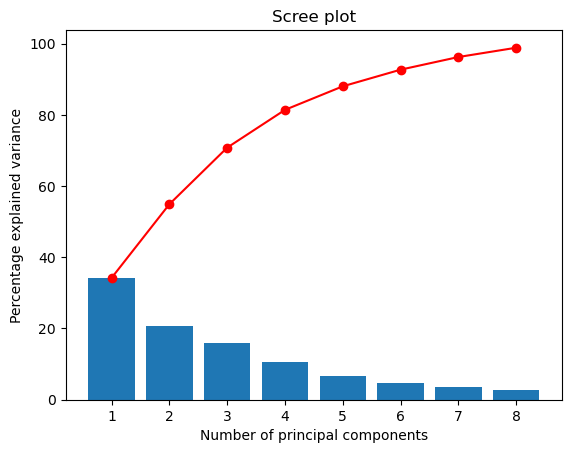

In [26]:
display_scree_plot(pca_Data)

#### 2.3.4 Correlation Circle

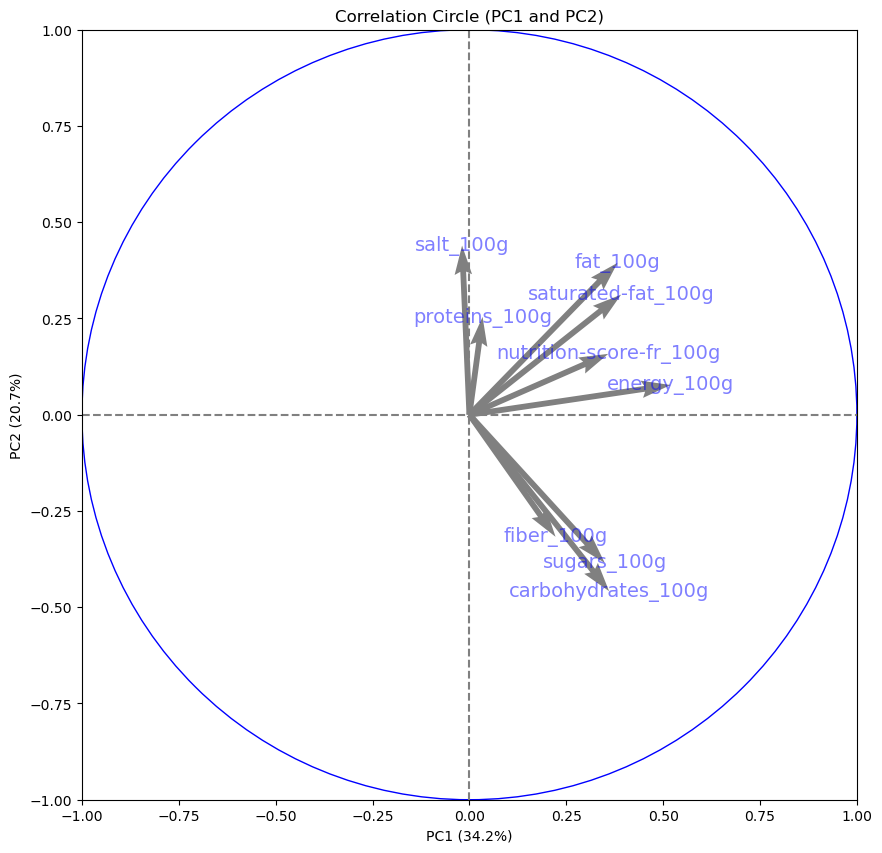

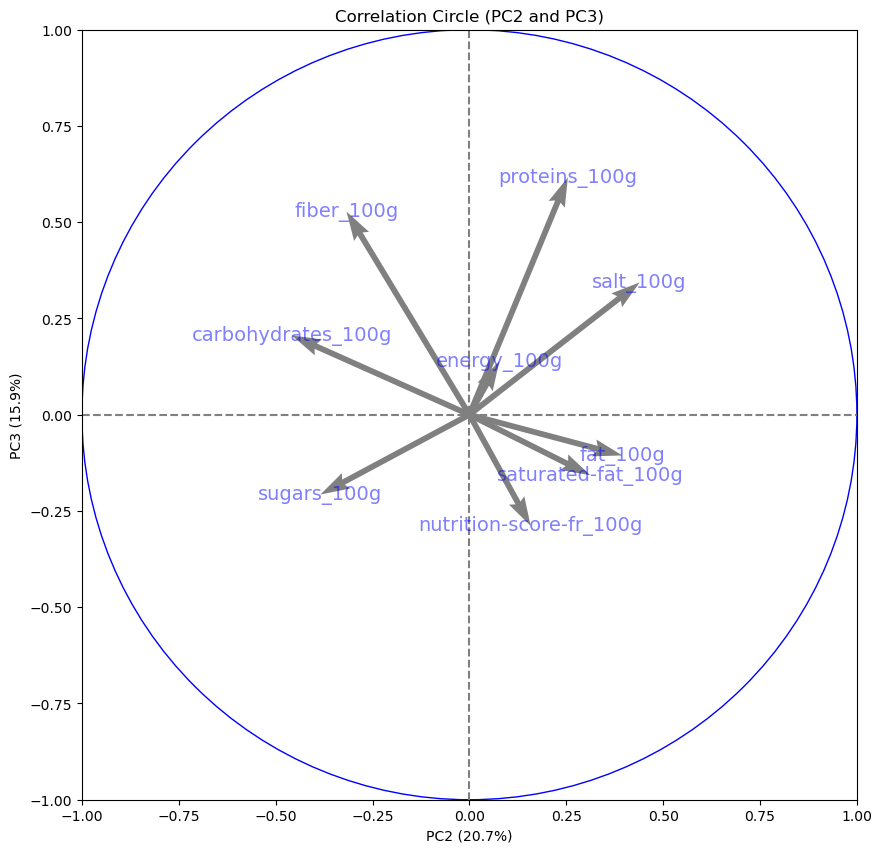

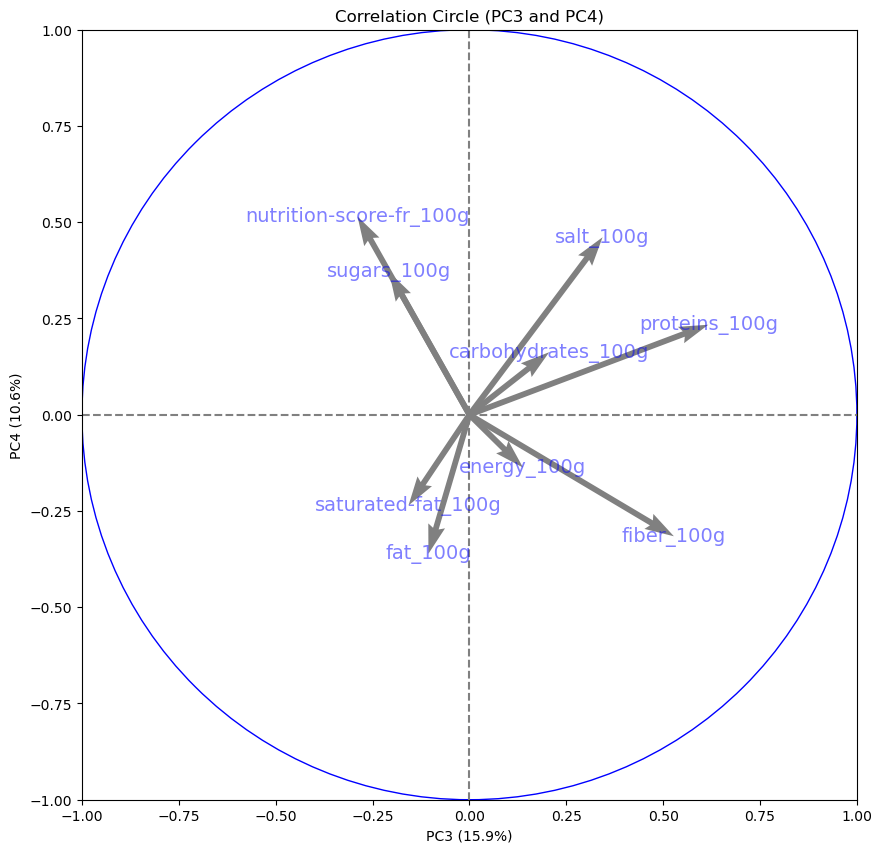

In [27]:
pca_Data.components_=np.around(pca_Data.components_, decimals=4)

# generate correlation circles of PC1 to PC4
num_components = 8
pcs=pca_Data.components_
display_circles(pcs, num_components, pca_Data, [(0,1),(1,2),(2,3)], labels = colu,)

 - 

###### Narratives - 
  - The principal components PC1 to PC4 explain 81.39% of the variations while the remaining PC5 to PC8 account for 18.61%. Hence, they can be used to explain the variance in the dataset
  - Fibre, sugar, and carbohydrate display moderate positive correlations with the highest variance from the carbohydrate
  - Fats and saturated fats exhibit strong positive correlations with energy, and they all have a good control on the nutritional scores. The approximately 90 degree angles between these nutrients and Fibre, sugar, and carbohydrate suggests lack of correlation between these features on the PC1 and PC2 projection.
  - Protein do not show any relationship with other nutrients, except salts, and it's projected along the PC2. 
  - The PC1 and PC2 both account for about 55% of the total variance.
  - Variations are observed between all the nutrients on the PC2 against PC3 and PC3 and PC4 projections. This points to the huge variability and overlaps between the nutrients. 

###### Individual Factorial Maps
 - projection of the PCA data on 2-dimensional scatter plots (Factor Maps)

<Figure size 1500x750 with 0 Axes>

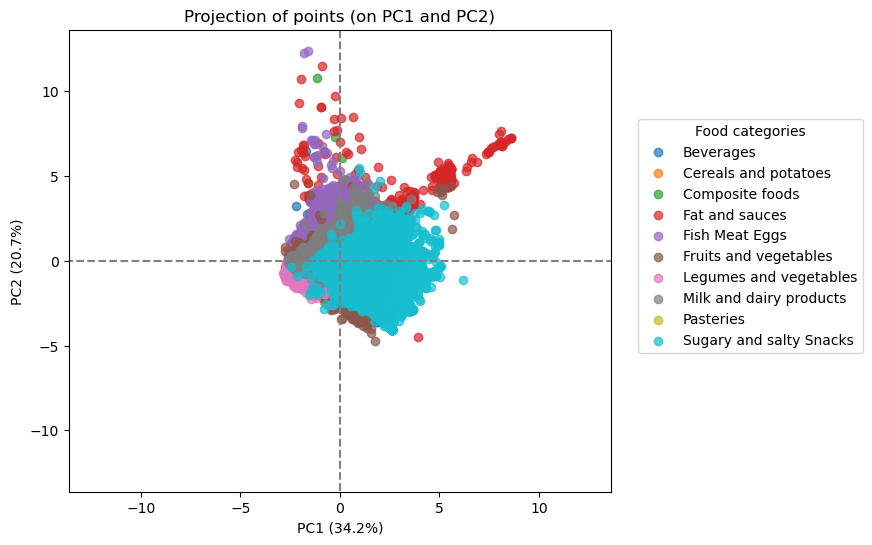

<Figure size 1000x500 with 0 Axes>

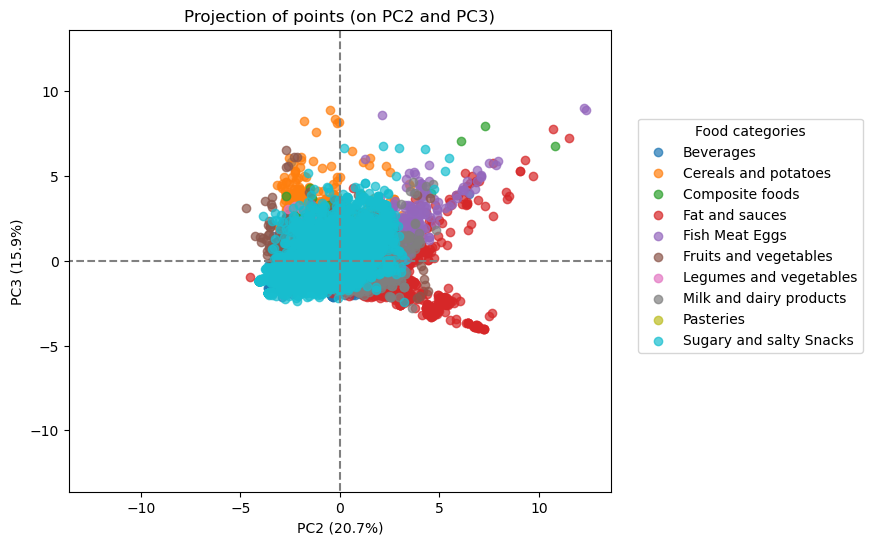

<Figure size 1000x500 with 0 Axes>

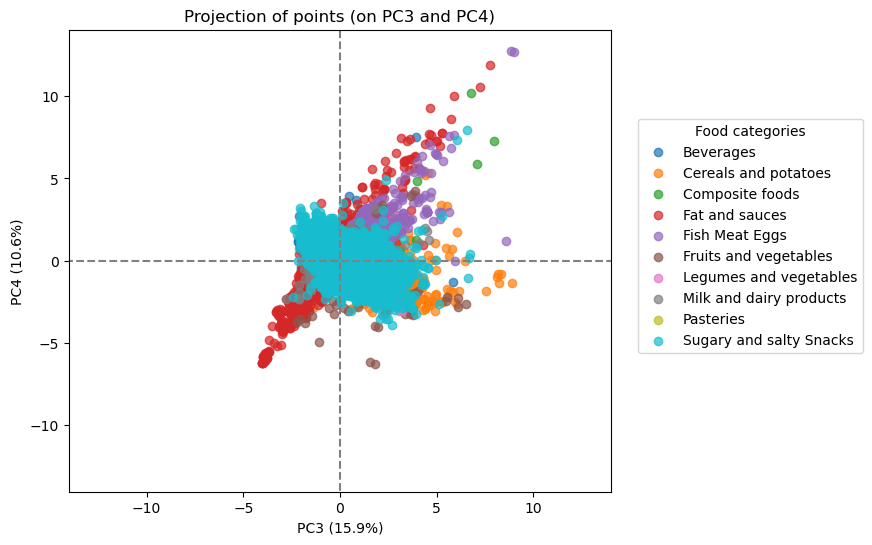

In [28]:
# according to food categories

labels_2 = np.array(Data['Category'])

# Transform the original scaled data to the new vector space
Data_projected = pca_Data.transform(scaled_Data)

# Display scatter plots of the data points in this new vector space

# PC1 against PC2
plt.figure(figsize=(10,5), dpi = 150)
display_factorial_planes(Data_projected, num_components, pca_Data, [(0,1)], illustrative_var = labels_2, alpha = 0.7)
plt.legend(loc=(1.05,0.3), title = 'Food categories')
plt.show()

# PC2 against PC3
plt.figure(figsize=(10,5), dpi = 100)
display_factorial_planes(Data_projected, num_components, pca_Data, [(1,2)], illustrative_var = labels_2, alpha = 0.7)
plt.legend(loc=(1.05,0.3), title = 'Food categories')
plt.show()

# PC3 against PC4
plt.figure(figsize=(10,5), dpi = 100)
display_factorial_planes(Data_projected, num_components, pca_Data, [(2,3)], illustrative_var = labels_2, alpha = 0.7)
plt.legend(loc=(1.05,0.3), title = 'Food categories')
plt.show()

<Figure size 1000x500 with 0 Axes>

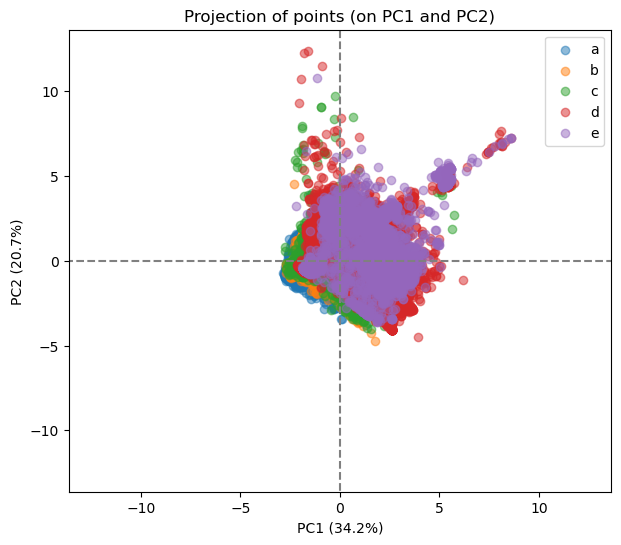

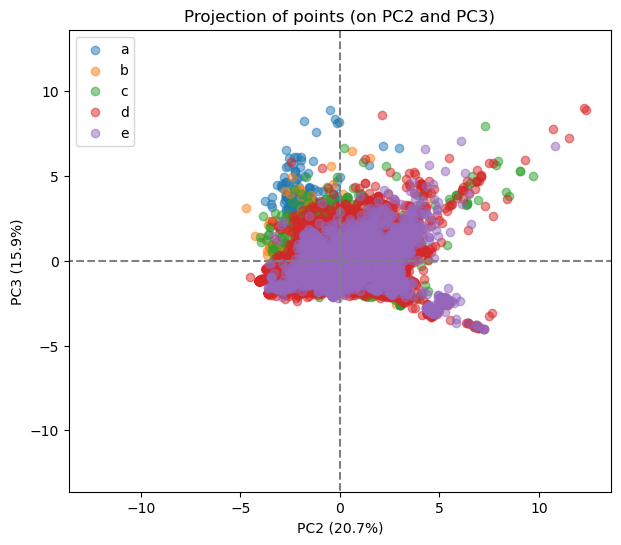

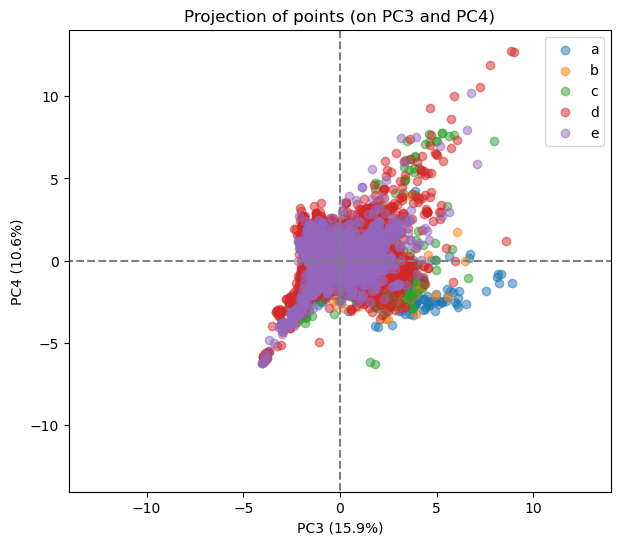

In [29]:
# according to nutrition grades categories
labels = np.array(Data['nutrition_grade_fr'])
plt.figure(figsize=(10,5), dpi = 100)
# Display a scatter plot of the data points in this new vector space
display_factorial_planes(Data_projected, num_components, pca_Data, [(0,1),(1,2),(2,3)], 
                         illustrative_var = labels, alpha = 0.5)
plt.show()

### 3.0 K-means Clustering

In [30]:
# Import the kmeans algorithm
from sklearn.cluster import KMeans

# Create a k-means clustering model
kmeans = KMeans(init='random', n_clusters=4, n_init=10)

# Fit the data to the model
kmeans.fit(scaled_Data)

# Determine which clusters each data point belongs to:
clusters =  kmeans.predict(scaled_Data)

In [31]:
# Add cluster number to the original data
scaled_Data_clustered = pd.DataFrame(scaled_Data, index = Data.index, columns=[col])
scaled_Data_clustered['cluster'] = clusters

#### Select the number of clusters
Produce an elbow curve:

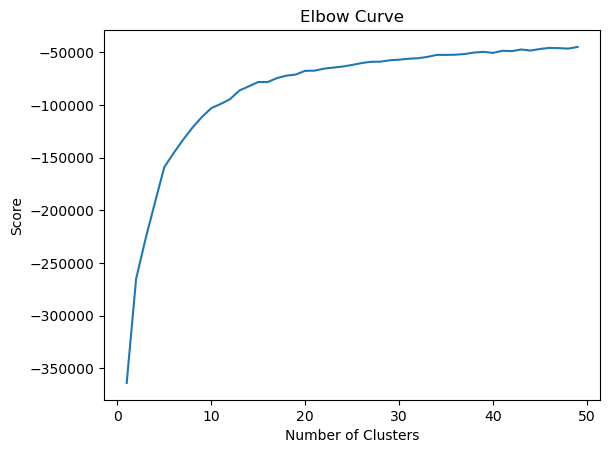

In [32]:
# Run a number of tests, for 1, 2, ... num_clusters
num_clusters = 50
kmeans_tests = [KMeans(n_clusters=i, init='random', n_init=10) for i in range(1, num_clusters)]
score = [kmeans_tests[i].fit(scaled_Data).score(scaled_Data) for i in range(len(kmeans_tests))]

# Plot the curve
plt.plot(range(1, num_clusters),score)
plt.xlabel('Number of Clusters')
plt.ylabel('Score')
plt.title('Elbow Curve')
plt.show()

- The optimum number of clusters seems to be between 10 and 15

Perform PCA with 2 PCs

In [33]:
pca = PCA(n_components=2)
pca.fit(scaled_Data)

# Transfor the scaled data to the new PCA space
Data_reduced = pca.transform(scaled_Data)

In [34]:
# Convert to a data frame
Data_reduced_df = pd.DataFrame(Data_reduced, columns=['PC1','PC2'])
Data_reduced_df['cluster'] = clusters
Data_reduced_df.head()

,PC1,PC2,cluster
0,0.663808,-0.532079,3
1,-1.696645,0.313005,1
2,3.607366,-0.321018,3
3,1.145323,-1.721132,3
4,-1.454923,-0.376362,1


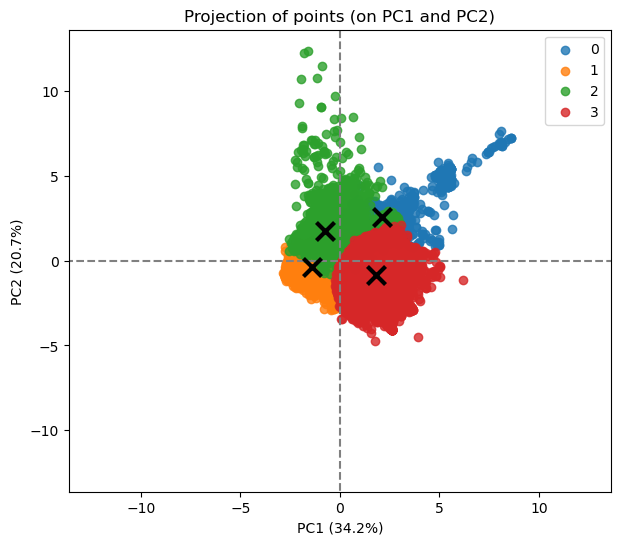

In [35]:
#Apply PCA transformation to the centroids
centres_reduced = pca.transform(kmeans.cluster_centers_)

# Display the data points and centroids 

display_factorial_planes(Data_reduced, 2, pca, [(0,1)], illustrative_var = clusters, alpha = 0.8)
plt.scatter(centres_reduced[:, 0], centres_reduced[:, 1], marker='x', s=169, linewidths=3, color='k', zorder=10)
plt.show()

In [36]:
# Display a parallel coordinates plot for the clusters in df

#display_parallel_coordinates(scaled_Data_clustered, 4)

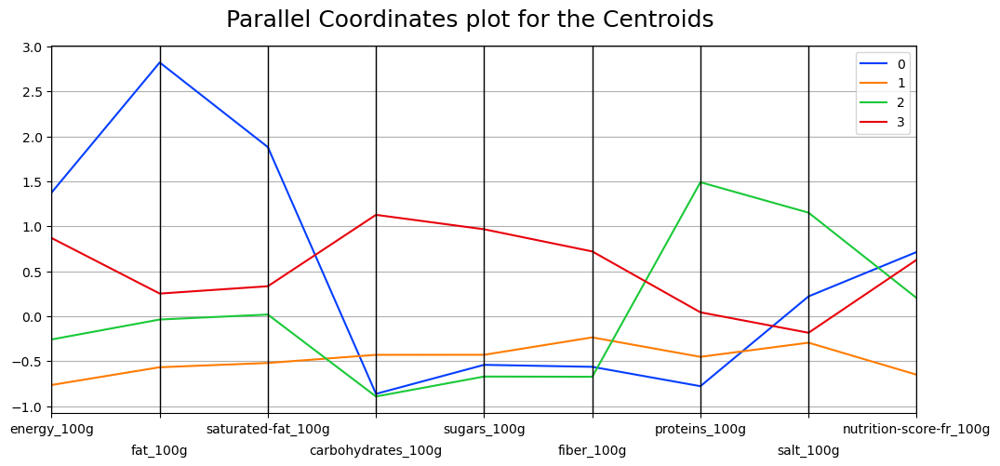

In [37]:
# Create a data frame containing our centroids
centroids = pd.DataFrame(kmeans.cluster_centers_, columns=col)
centroids['cluster'] = centroids.index

display_parallel_coordinates_centroids(centroids, 10)

### 4.0 Statistical Test

##### One-way ANOVA
 - Analysis of variance: statistical test between numerical and categorical nutrient variables 
 - Null hypothesis (H0): there is no difference among group means

F-value and 
 - Carbohydrates eta squared

In [38]:
# Statmodel

# For carbohydrates 
mod = ols('carbohydrates_100g ~ Category', data=Data).fit()
aov_table = sm.stats.anova_lm(mod, typ=1)
    
# calculate effect of size eta squared
esq_sm_c = aov_table['sum_sq'][0]/(aov_table['sum_sq'][0]+aov_table['sum_sq'][1])

print(aov_table)

               df        sum_sq       mean_sq             F  PR(>F)
Category      9.0  2.231229e+07  2.479143e+06  15577.432746     0.0
Residual  40411.0  6.431396e+06  1.591496e+02           NaN     NaN


In [39]:
esq_sm_c

0.7762500910337929

- Proteins

In [40]:
mod = ols('proteins_100g ~ Category', data=Data).fit()
aov_table = sm.stats.anova_lm(mod, typ=1)
    
# calculate effect of size eta squared
esq_sm_p = aov_table['sum_sq'][0]/(aov_table['sum_sq'][0]+aov_table['sum_sq'][1])

print(aov_table)

               df         sum_sq       mean_sq            F  PR(>F)
Category      9.0  754716.627563  83857.403063  8387.526775     0.0
Residual  40411.0  404023.928151      9.997870          NaN     NaN


In [41]:
esq_sm_p

0.651324944001821

- Energy

In [42]:
mod = ols('energy_100g ~ Category', data=Data).fit()
aov_table = sm.stats.anova_lm(mod, typ=1)
    
# calculate effect of size eta squared
esq_sm_e = aov_table['sum_sq'][0]/(aov_table['sum_sq'][0]+aov_table['sum_sq'][1])

print(aov_table)

               df        sum_sq       mean_sq            F  PR(>F)
Category      9.0  1.545079e+10  1.716755e+09  6162.777256     0.0
Residual  40411.0  1.125723e+10  2.785684e+05          NaN     NaN


In [43]:
esq_sm_e 

0.5785076350925438

- Sugars

In [44]:
mod = ols('sugars_100g ~ Category', data=Data).fit()
aov_table = sm.stats.anova_lm(mod, typ=1)
    
# calculate effect of size eta squared
esq_sm_s = aov_table['sum_sq'][0]/(aov_table['sum_sq'][0]+aov_table['sum_sq'][1])

print(aov_table)

               df        sum_sq        mean_sq            F  PR(>F)
Category      9.0  7.835004e+06  870555.980881  5263.525799     0.0
Residual  40411.0  6.683740e+06     165.394075          NaN     NaN


In [45]:
esq_sm_s

0.539647502505302

- Fats

In [46]:
mod = ols('fat_100g ~ Category', data=Data).fit()
aov_table = sm.stats.anova_lm(mod, typ=1)
    
# calculate effect of size eta squared
esq_sm_f = aov_table['sum_sq'][0]/(aov_table['sum_sq'][0]+aov_table['sum_sq'][1])

print(aov_table)

               df        sum_sq        mean_sq           F  PR(>F)
Category      9.0  6.677017e+06  741890.753469  6301.30199     0.0
Residual  40411.0  4.757834e+06     117.736105         NaN     NaN


In [47]:
esq_sm_f

0.5839181514783697

- Salts

In [48]:
mod = ols('salt_100g ~ Category', data=Data).fit()
aov_table = sm.stats.anova_lm(mod, typ=1)
    
# calculate effect of size eta squared
esq_sm_sa = aov_table['sum_sq'][0]/(aov_table['sum_sq'][0]+aov_table['sum_sq'][1])

print(aov_table)

               df        sum_sq      mean_sq            F  PR(>F)
Category      9.0  12228.746775  1358.749642  1377.452765     0.0
Residual  40411.0  39862.297411     0.986422          NaN     NaN


In [49]:
esq_sm_sa

0.23475718266212864

- Fiber

In [50]:
mod = ols('fiber_100g ~ Category', data=Data).fit()
aov_table = sm.stats.anova_lm(mod, typ=1)
    
# calculate effect of size eta squared
esq_sm_fb = aov_table['sum_sq'][0]/(aov_table['sum_sq'][0]+aov_table['sum_sq'][1])

print(aov_table)

               df         sum_sq       mean_sq           F  PR(>F)
Category      9.0  135205.720055  15022.857784  5335.38557     0.0
Residual  40411.0  113785.348399      2.815702         NaN     NaN


In [51]:
esq_sm_fb

0.543014337401189

In [52]:
# put all the calculated F-values and esq in a table
Anova = {"Nutrients": ['Carbohydrates', 'Energy', 'Fats', 'Fiber', 'Proteins','Sugars', 'Salt'],
        "F-ratio": [15577, 6163, 6301, 5335, 8387, 5263, 1377],
        "Eta": [0.78, 0.58, 0.58, 0.54, 0.65, 0.54, 0.23],
        "Classification": ['High','High', 'High', 'High', 'High', 'High', 'High']}
Table = pd.DataFrame(Anova)
Table

,Nutrients,F-ratio,Eta,Classification
0,Carbohydrates,15577,0.78,High
1,Energy,6163,0.58,High
2,Fats,6301,0.58,High
3,Fiber,5335,0.54,High
4,Proteins,8387,0.65,High
5,Sugars,5263,0.54,High
6,Salt,1377,0.23,High


##### Narratives:
 - the high F-ratio of all features show that we could reject the null hypothesis. This indicates that the means of the variables are not from the same population, making the variances if the features/variables to be genuine

### 5.0 Model Creation

In [53]:
Data.columns

Index(['code', 'product_name', 'pnns_groups_1', 'pnns_groups_2',
       'nutrition_grade_fr', 'energy_100g', 'fat_100g', 'saturated-fat_100g',
       'carbohydrates_100g', 'sugars_100g', 'fiber_100g', 'proteins_100g',
       'salt_100g', 'sodium_100g', 'nutrition-score-fr_100g',
       'nutrition-score-uk_100g', 'Category'],
      dtype='object')

In [54]:
#create new dataframe with few uncorrelated numerical features 

df_Mod = Data.loc[:, ['code', 'product_name', 'pnns_groups_2', 'nutrition_grade_fr', 'nutrition-score-fr_100g',
                      'Category','fiber_100g', 'carbohydrates_100g', 'sugars_100g', 'fat_100g', 'energy_100g',
                  'proteins_100g', 'salt_100g']]
df_Mod.shape

(40421, 13)

#### 5.1 Pre-process the text to remove special characters

In [55]:
import re

def clean_category(Category):
    Category = Category.lower()
    return Category

df_Mod['Category'] = df_Mod['Category'].apply(clean_category)
df_Mod

,code,product_name,pnns_groups_2,nutrition_grade_fr,nutrition-score-fr_100g,Category,fiber_100g,carbohydrates_100g,sugars_100g,fat_100g,energy_100g,proteins_100g,salt_100g
0,0000001938067,Chaussons tressés aux pommes,Biscuits and cakes,c,9.000000,sugary and salty snacks,3.520498,38.700000,24.700000,10.700000,1090.000000,3.330000,0.647000
1,0000008237798,Quiche Lorraine,Pizza pies and quiche,b,2.131309,composite foods,0.357000,7.860000,0.714000,6.790000,478.000000,5.360000,0.499000
2,0000020424640,Belgische Pralinen,Sweets,e,11.977283,sugary and salty snacks,3.520498,60.565619,51.500000,33.300000,2257.000000,4.700000,0.090000
3,0000027533048,Luxury Christmas Pudding,Biscuits and cakes,c,10.000000,sugary and salty snacks,4.700000,54.200000,45.109926,7.000000,1284.000000,5.877508,0.199898
4,0000040608754,"Pepsi, Nouveau goût !",Sweetened beverages,e,13.000000,beverages,0.000000,10.400000,10.400000,0.000000,177.000000,0.000000,0.025400
...,...,...,...,...,...,...,...,...,...,...,...,...,...
40416,96092514,Blue Cheese Dressing,Dressings and sauces,d,10.030795,fat and sauces,0.831137,6.400000,5.300000,53.300000,2111.000000,1.700000,1.750060
40417,96118580,Fisherman's Friend Miel-Citron,Sweets,b,11.977283,sugary and salty snacks,1.470000,95.310000,45.109926,1.300000,1031.000000,0.004000,0.364057
40418,9778564312457,Nature cheddar and red onion crisps,Appetizers,c,9.000000,sugary and salty snacks,5.190905,47.357783,1.800000,33.420577,2155.000000,7.800000,1.350000
40419,9847548283004,Tartines craquantes bio au sarrasin,Bread,a,-4.000000,cereals and potatoes,5.900000,74.800000,2.600000,2.800000,1643.000000,13.000000,0.680000


#### 5.2 Split the dataset

In [56]:
X = df_Mod.drop(['nutrition_grade_fr'], axis = 1)
y = df_Mod['nutrition_grade_fr']

In [57]:
X.shape

(40421, 12)

In [58]:
y.shape

(40421,)

In [59]:
# split the dataset to train and test sets at 80/20 ratio
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 50)

In [60]:
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((32336, 12), (8085, 12), (32336,), (8085,))

#### 5.3 Vectorized the texts

In [61]:
# import vectorizer to build frequency matrix and convert texts to numbers
from sklearn.feature_extraction.text import TfidfVectorizer

# initialize class range to look at two successive words consecutively
vectorizer = TfidfVectorizer(ngram_range=(1,2))

# convert texts to matrix (numpy vectors)
tfidf = vectorizer.fit_transform(df_Mod['Category'])

#### 5.4 Apply cosine similarity to create a search engine 

In [62]:
#Import cosine_similarity to measure similarity between inputed texts
from sklearn.metrics.pairwise import cosine_similarity

def search(Category):
    Category = clean_category(Category) # clean inputed texts
    
    # convert inputed texts to numbers
    query_vec = vectorizer.transform([Category])
    
    # compare inputed texts with stored categories in our dataset
    cos_sim  = cosine_similarity(query_vec,tfidf).flatten() 
    
    # return 5 most similar search terms or texts
    indices = np.argpartition(cos_sim, -5)[-5:] 
    
    # indices of the most similar search in descending order (from top to least similar)
    results = df_Mod.iloc[indices].iloc[::-1]

    return results

#### 5.5 Test the model
 - perform search

In [63]:
search('cereals and potatoes')

,code,product_name,pnns_groups_2,nutrition_grade_fr,nutrition-score-fr_100g,Category,fiber_100g,carbohydrates_100g,sugars_100g,fat_100g,energy_100g,proteins_100g,salt_100g
22652,3560070329151,Pasta Macaroni (8 min Al dente),Cereals,a,-5.0,cereals and potatoes,5.40692,68.000000,3.500000,6.765844,1458.0,9.463442,0.0254
22697,3560070341740,Petits pains grillés au blé complet,Bread,c,7.0,cereals and potatoes,6.50000,68.000000,4.500000,6.800000,1652.0,11.000000,1.6000
22698,3560070341771,100 Biscottes,Bread,c,6.0,cereals and potatoes,6.20000,57.316974,7.800000,6.765844,1623.0,9.463442,1.2700
22696,3560070341719,Petits pains grillés au froment,Bread,c,8.0,cereals and potatoes,4.50000,57.316974,7.000000,8.000000,1726.0,10.000000,1.1430
22689,3560070340118,Basmati long grain,Cereals,a,-2.0,cereals and potatoes,1.30000,57.316974,6.111708,6.765844,1462.0,8.900000,0.0000
